# Check Change in Performance with Increasing Number of Ensemble Members

<hr/>

#### Imports

In [1]:
import copy
import os

import math

import matplotlib as mpl
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

from datetime import datetime

from ensemble_uncertainties.evaluators.evaluator_support import format_time_elapsed
from ensemble_uncertainties.utils.ad_assessment import decreasing_coeff, rmses_frac

from math import log as ln
from math import pi

from scipy.stats import kendalltau, spearmanr

from sklearn.metrics import r2_score

#### Constants

In [2]:
N_REPETITIONS = 100
N_SPLITS = 2
TASK = 'regression'
DATA_FOLDER = f'~/PowerFolders/ensemble_ad/data/featurized/{TASK}/'
RESULT_FOLDER = f'~/PowerFolders/ensemble_ad/data/results/initial_results/{TASK}/'
NLL_CONSTANT = ln(2 * pi)
ALLOWED_RANGE_FACTOR = .5

#### Settings

In [3]:
mpl.rcParams['figure.dpi'] = 200

algorithms = ['rf', 'xgb', 'svm_rbf', 'shallow', 'dropout', 'deep']
algorithm_to_name = {'rf' : 'RF', 'xgb' : 'XGB', 'svm_rbf' : 'SVM', 'shallow' : 'Shallow', 'dropout' : 'Deep/Dropout', 'deep' : 'Deep'}

descriptors = ['maccs', 'ecfc', 'rdkit', 'cddd']
descriptor_to_name = {'maccs' : 'MACCS', 'ecfc' : 'ECFC', 'rdkit' : 'RDKit', 'cddd' : 'CDDD'}

uncertainty_measure = 'spearman' # choice of: 'nll', 'dr', 'spearman', and 'kendalltau'

PLOT_FOLDER = f'./plots_with_outlier_filter/'

# Names of the datasets that were already run
dataset_names = [
    'tetrahymena',
    'freesolv',
    'esol',
    'MMP2',
    'IL4',
    'F7',
    'O14965',
    'O60674',
    'P03372',
    'Q16602',
    'Q92731'
]

#### Functions

In [4]:
def load_results_file(name, algorithm, descriptor, n_repetitions=N_REPETITIONS, n_splits=N_SPLITS):
    """Loads results from disk for a given combination of ML settings."""
    path = f'{RESULT_FOLDER}{name}_{n_repetitions}/{algorithm}/{descriptor}/single_predictions/test.csv'
    results = pd.read_csv(path, sep=';').set_index('id')
    single_tables = list()
    for i in range(n_repetitions):
        partial_results = results[[f'rep{i}_split{j}' for j in range(n_splits)]]
        single_tables.append(partial_results)
    return single_tables


def load_true(name):
    """Loads dependent variables of a given dataset."""
    path = f'{DATA_FOLDER}{name}/{name}_y.csv'
    y = pd.read_csv(path, sep=';').set_index('id')
    return y


def harmonize(values):
    """Subtracts smallest value and divides by largest, so all values will be in [0, 1]."""
    floored_values = values - values.min()
    scaled_floored_values = floored_values / floored_values.max()
    return scaled_floored_values


def cumulative_predictive_performance(single_tables, y):
    """Computes the change in R^2 when taking more and more ensemble members into account."""
    members = pd.DataFrame(index=y.index)
    scores = list()
    for i, member in enumerate(single_tables):
        members = pd.concat([members, member], axis=1)
        mean = members.mean(axis=1)
        scores.append(r2_score(y['y'], mean.values))
    scores = np.array(scores)
    return scores


def clean_member(member_raw, y):
    """Removes predictions that are outside the allowed y-range"""
    member = copy.deepcopy(member_raw)
    for column in member.columns:
        # To the current column, those indeces
        # that are nan belong to training samples
        train_y = y.loc[member[~member[column].isnull()].index]
        train_y_range = train_y.max() - train_y.min()
        boundary = ALLOWED_RANGE_FACTOR * train_y_range
        allowed_min = (train_y.min() - boundary).values[0]
        allowed_max = (train_y.max() + boundary).values[0]
        exclusion = ((member[column] < allowed_min) | (member[column] > allowed_max))
        member.loc[exclusion] = np.nan
    return member


def clean_from_nan(true, pred, resd, sdev):
    """Returns all 4 lists but without nan entries."""
    altogether = pd.DataFrame(index=true.index)
    altogether['y'] = list(true['y'].values)
    altogether['pred'] = list(pred)
    altogether['resd'] = list(resd.values)
    altogether['sdev'] = list(sdev.values)
    altogether.dropna(subset=['y', 'pred', 'resd', 'sdev'], inplace=True)
    true_clean_df = pd.DataFrame(altogether['y'])
    pred_clean_sr = altogether['pred']
    resd_clean_sr = altogether['resd']
    sdev_clean_sr = altogether['sdev']
    return true_clean_df, pred_clean_sr, resd_clean_sr, sdev_clean_sr


def cumulative_performance(single_tables, y, do_harmonize=True, clean=True):
    """Computes the change in R^2 and uncertainty measure when taking more and more ensemble members into account."""
    members = pd.DataFrame(index=y.index)
    r2_scores = list()
    decreases = list()
    for i, pre_member in enumerate(single_tables):
        # Collect members
        if clean:
            member = clean_member(pre_member, y)
        else:
            member = pre_member
        members = pd.concat([members, member], axis=1)
        # Compute necessary values
        mean = members.mean(axis=1)
        sdev = members.std(axis=1)
        resd = y['y'] - mean
        # Clean in case some values are nan
        y_clean = copy.deepcopy(y)
        if i > 0:
            y_clean, mean, resd, sdev = clean_from_nan(y_clean, mean, resd, sdev)
        mean = mean.dropna()
        y_clean = y_clean.loc[mean.index]
        # Score predictive performance
        r2_scores.append(r2_score(y_clean['y'], mean.values))
        if i > 0:
            # Score uncertainty performance
            if uncertainty_measure == 'nll':
                avg_nll = nll(resd, sdev)
                decreases.append(avg_nll)
            elif uncertainty_measure == 'dr':
                oracle_rmses, measure_rmses = rmses_frac(resd, sdev)
                decrease = decreasing_coeff(measure_rmses)
                decreases.append(decrease)
            elif uncertainty_measure == 'spearman':
                decrease = spearmanr(resd.abs(), sdev)[0]
                decreases.append(decrease)
            elif uncertainty_measure == 'kendalltau':
                decrease = kendalltau(resd.abs(), sdev)[0]
                decreases.append(decrease)
    r2_scores = np.array(r2_scores)
    decreases = np.array(decreases)
    if do_harmonize:
        harmonized_r2_scores = harmonize(r2_scores)
        harmonized_decreases = harmonize(decreases)
        return harmonized_r2_scores, harmonized_decreases
    else:
        return r2_scores, decreases
    
    
def nll(resids, uncertainties):
    """Computes the average log-likelihood according to
    https://pubs.acs.org/doi/abs/10.1021/acs.jcim.0c00502
    """
    n = len(resids)
    def nll_i(r_i, u_i):
        return NLL_CONSTANT + ln(u_i) + (r_i**2)/u_i
    vals = [nll_i(r_i, u_i) for r_i, u_i in zip(resids, uncertainties)]
    avg_nll = sum(vals) / (2 * n)
    return avg_nll


def cumulative_performances_for_several_descriptors(name, algorithm, descriptors, n_repetitions=N_REPETITIONS, n_splits=N_SPLITS, do_harmonize=True):
    """Runs cumulative_performance for several descriptors."""
    single_tables_list = [load_results_file(name, algorithm, descriptor, n_repetitions=n_repetitions, n_splits=n_splits) for descriptor in descriptors]
    y = load_true(name)
    value_lists = [cumulative_performance(single_tables, y, do_harmonize) for single_tables in single_tables_list]
    return value_lists


def plot_cumulative_scores(values_list, descriptors, ax, y_label):
    """Plot change over values for several descriptors."""
    ax.grid(zorder=100)
    smallest_y_lim = .0
    for i, (values, descriptor) in enumerate(zip(values_list, descriptors)):
        if y_label == '$R^2$':
            ax.plot(np.arange(len(values)), values, zorder=100+i, label=descriptor_to_name[descriptor])
            ax.scatter([0], values[0], zorder=100+i)
        else:
            ax.plot([i for i in range(1, len(values)+1)], values, zorder=100+i, label=descriptor_to_name[descriptor])
            ax.scatter([1], values[0], zorder=100+i)
        if values.min() < smallest_y_lim:
            smallest_y_lim = values.min()
    if y_label == '$R^2$':
        ax.set_ylim(smallest_y_lim, 1.)
    else:
        if uncertainty_measure == 'spearman':
            ax.set_ylim(smallest_y_lim, .7)
        elif uncertainty_measure == 'kendalltau':
            ax.set_ylim(smallest_y_lim, .5)
    ax.set_xlabel('Number of ensemble members')
    ax.set_ylabel(y_label)
    ax.legend()
    
    
def make_title(name, algorithm, n_repetitions):
    """Formats a plot title."""
    actual_name = name
    if name == 'tetrahymena':
        actual_name = 'Tetrahymena'
    elif name == 'freesolv':
        actual_name = 'FreeSolv'
    elif name == 'esol':
        actual_name = 'ESOL'
    return f'{actual_name}, {algorithm_to_name[algorithm]}, {n_repetitions} repetitions'


def plot_for_descriptors(name, algorithm, descriptors, n_repetitions=N_REPETITIONS, n_splits=N_SPLITS, do_harmonize=True, plot_folder=PLOT_FOLDER):
    """Plot change of scores and AUCO for several descriptors in a comprehensive plot."""
    start = datetime.now()
    value_lists = cumulative_performances_for_several_descriptors(name, algorithm, descriptors, n_repetitions=n_repetitions, n_splits=n_splits, do_harmonize=do_harmonize)
    fig, (ax_score, ax_dr) = plt.subplots(1, 2, figsize=(10, 5), frameon=False)
    if do_harmonize:
        title = f'{make_title(name, algorithm, n_repetitions)}, harmonized to [0, 1]'
        image_path = f'{plot_folder}{name}_{algorithm}_{n_repetitions}_harmonized.png'
    else:
        title = make_title(name, algorithm, n_repetitions)
        image_path = f'{plot_folder}{name}_{algorithm}_{n_repetitions}.png'
    fig.suptitle(title)
    if uncertainty_measure == 'nll':
        y_label = '$NLL$'
    elif uncertainty_measure == 'dr':
         y_label = '$Decrease ratio$'
    elif uncertainty_measure == 'spearman':
         y_label = "$Spearman's \ rank \ CC$"
    elif uncertainty_measure == 'kendalltau':
         y_label = r"$Kendalls's \ \tau$"
    plot_cumulative_scores([v[0] for v in value_lists], descriptors, ax_score, '$R^2$')
    plot_cumulative_scores([v[1] for v in value_lists], descriptors, ax_dr, y_label)
    fig.tight_layout()
    plt.savefig(image_path, bbox_inches='tight', pad_inches=0.01)
    plt.show()
    run_time = datetime.now() - start
    print(f'Took {format_time_elapsed(run_time)}')

<hr/>

### Evaluate

Plot unharmonized

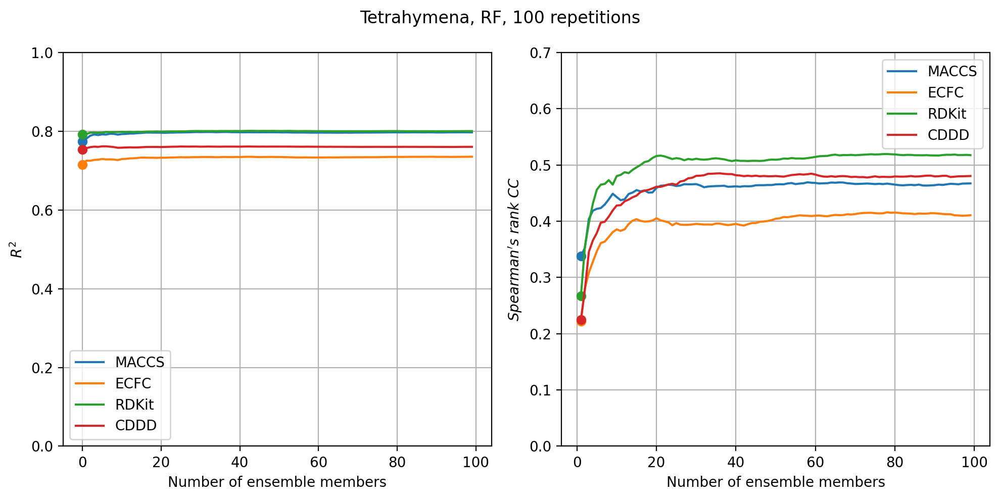

Took 4 Second(s). 


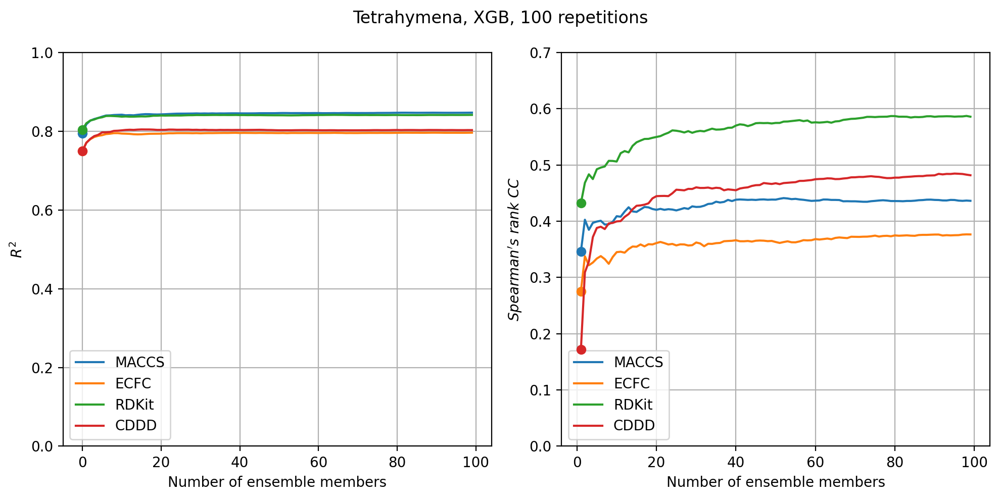

Took 4 Second(s). 


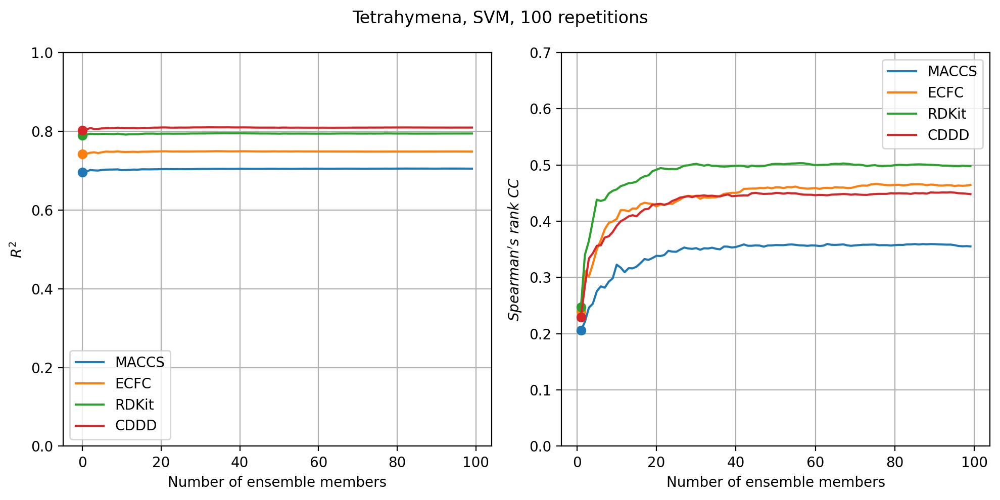

Took 4 Second(s). 


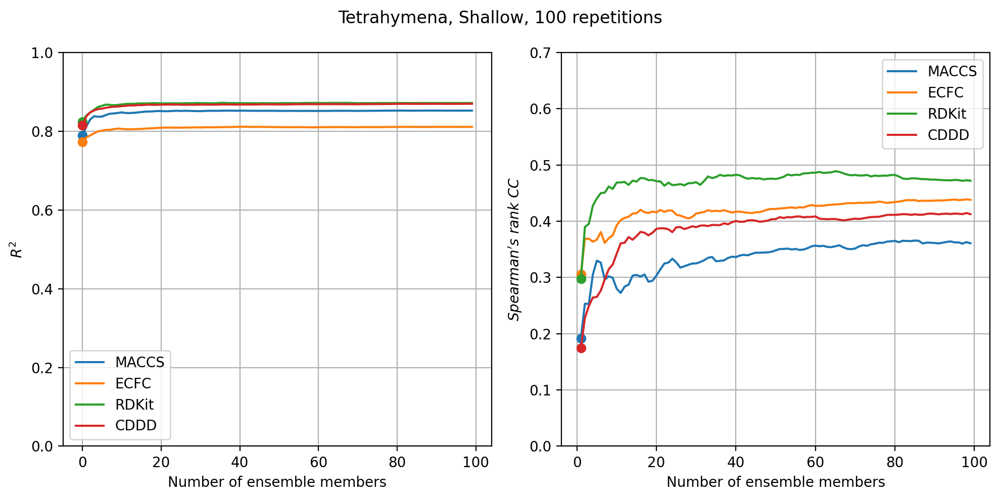

Took 4 Second(s). 


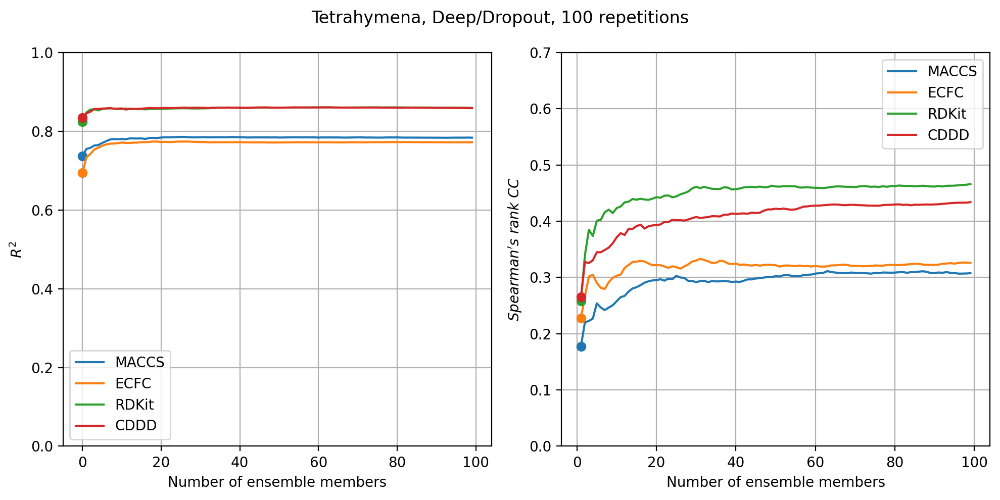

Took 4 Second(s). 


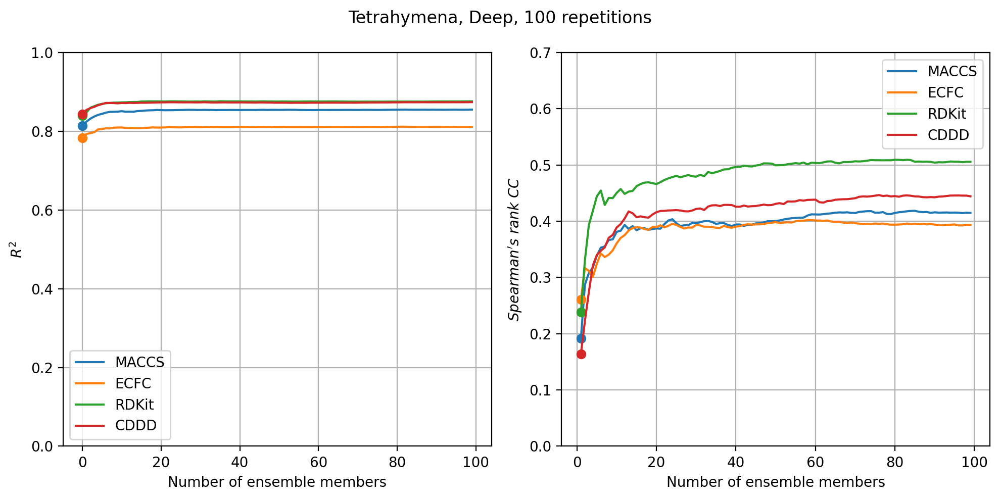

Took 4 Second(s). 


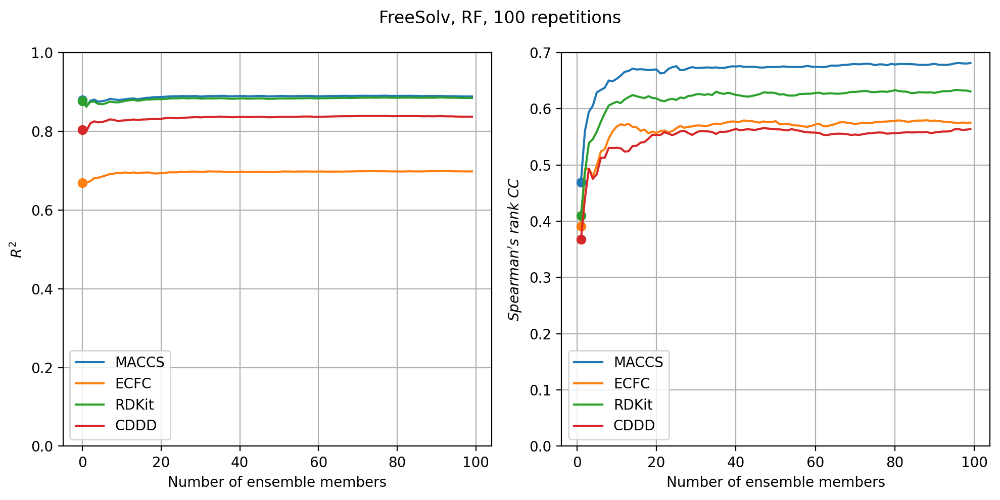

Took 3 Second(s). 


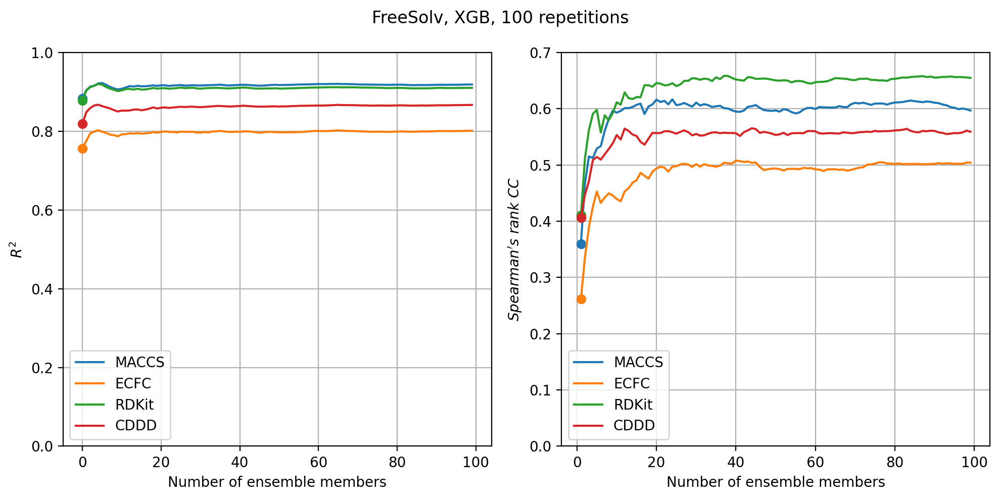

Took 3 Second(s). 


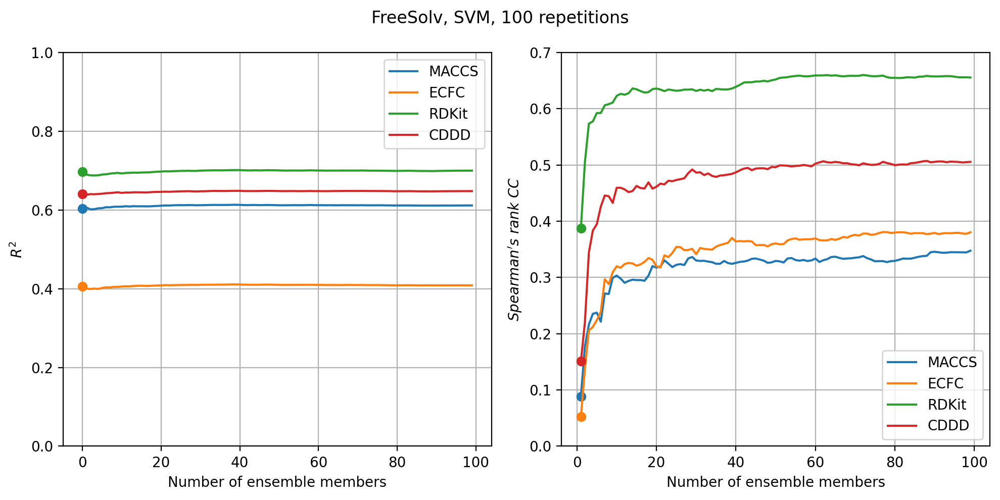

Took 3 Second(s). 


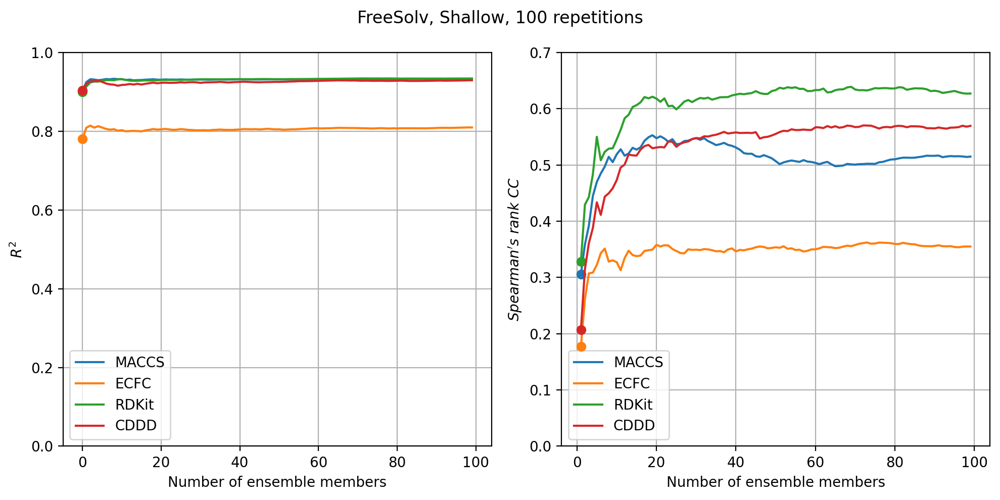

Took 3 Second(s). 


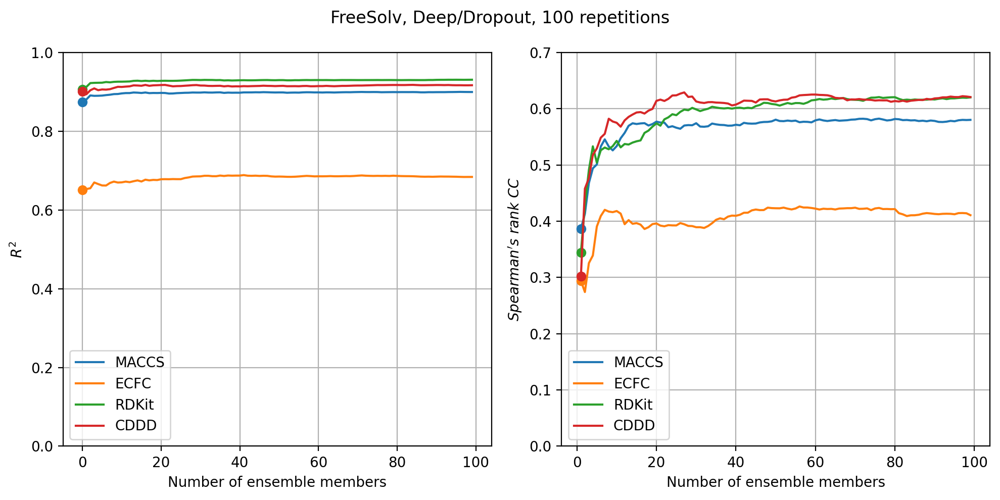

Took 3 Second(s). 


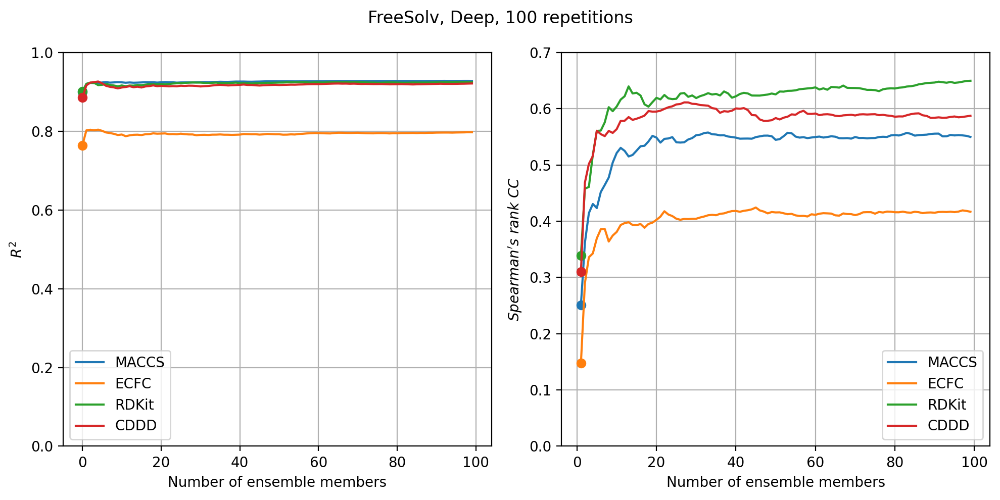

Took 3 Second(s). 


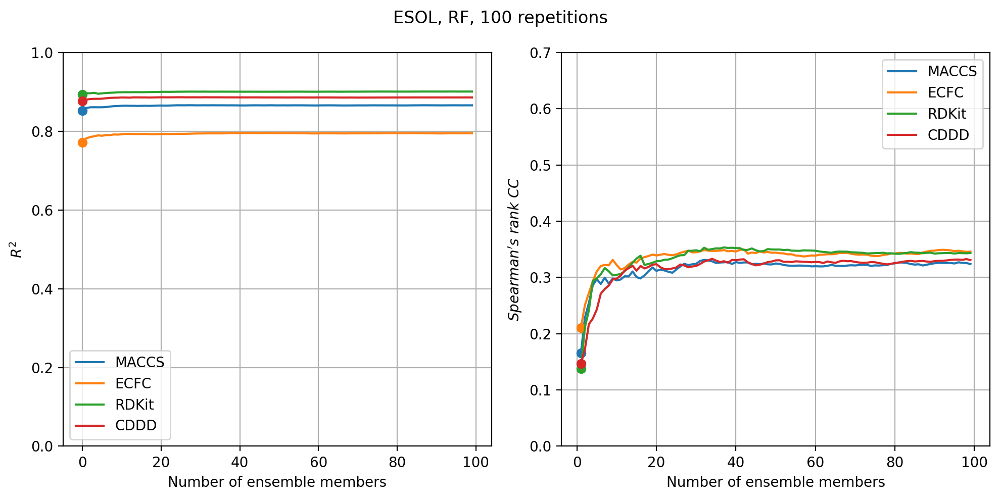

Took 3 Second(s). 


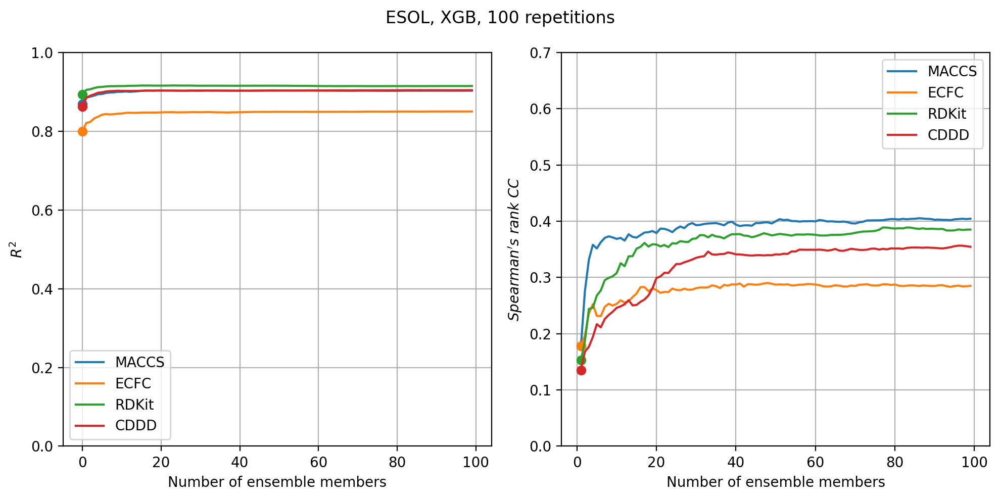

Took 3 Second(s). 


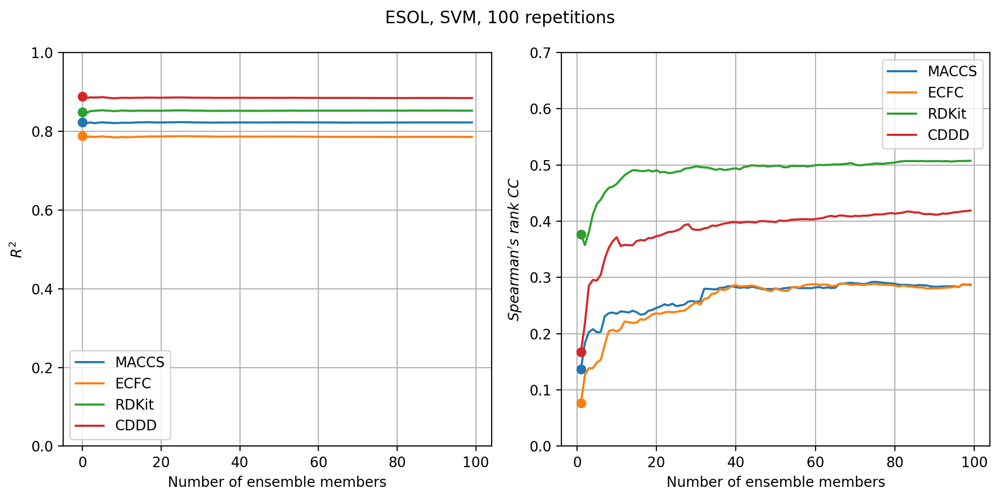

Took 3 Second(s). 


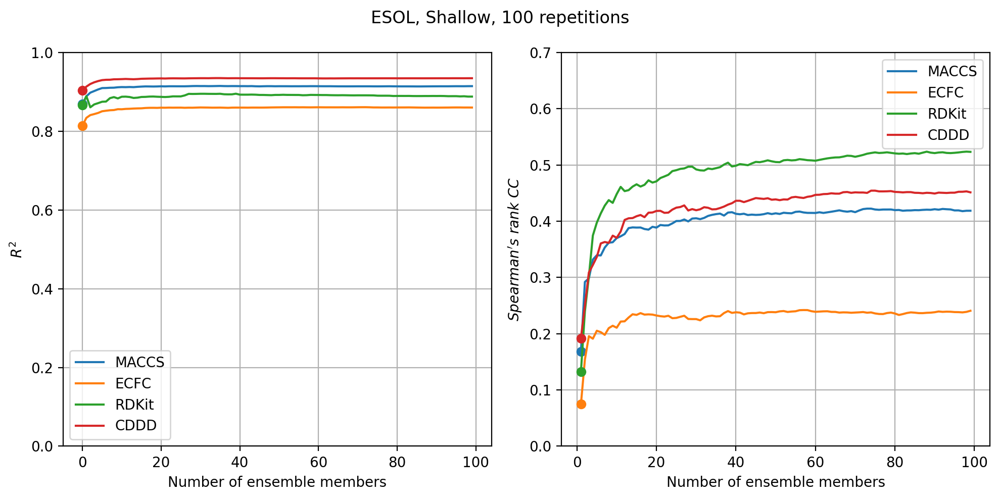

Took 3 Second(s). 


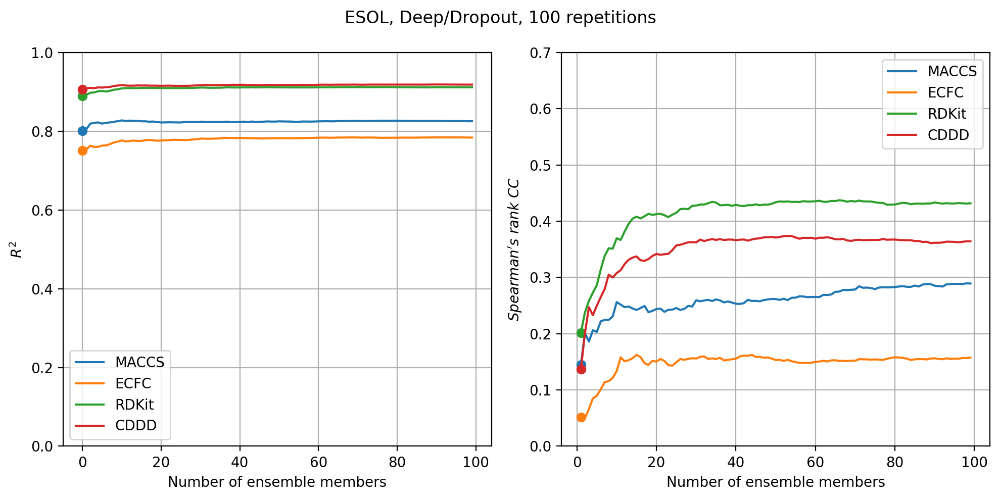

Took 3 Second(s). 


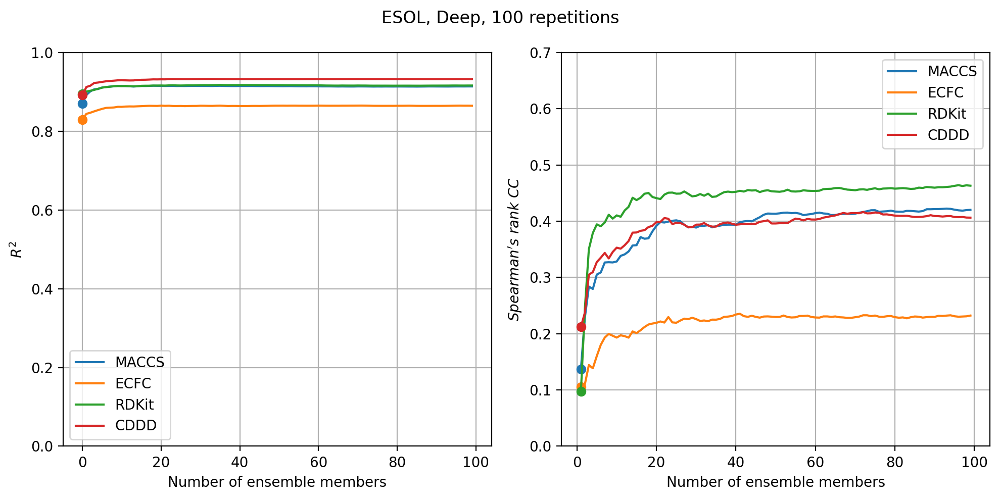

Took 3 Second(s). 


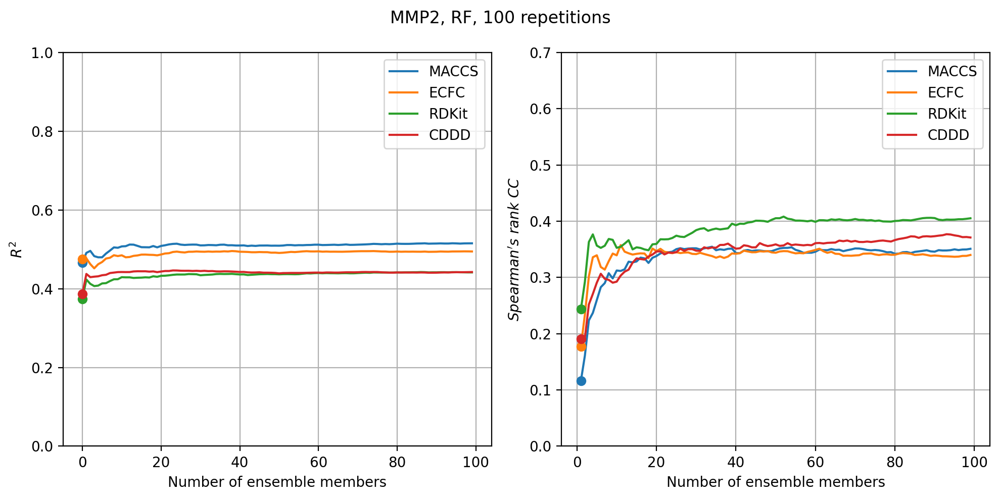

Took 3 Second(s). 


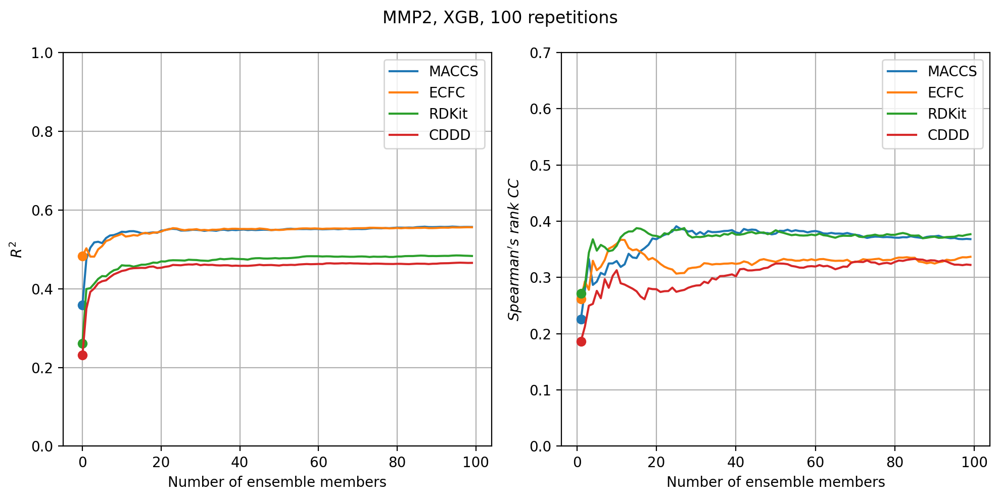

Took 3 Second(s). 


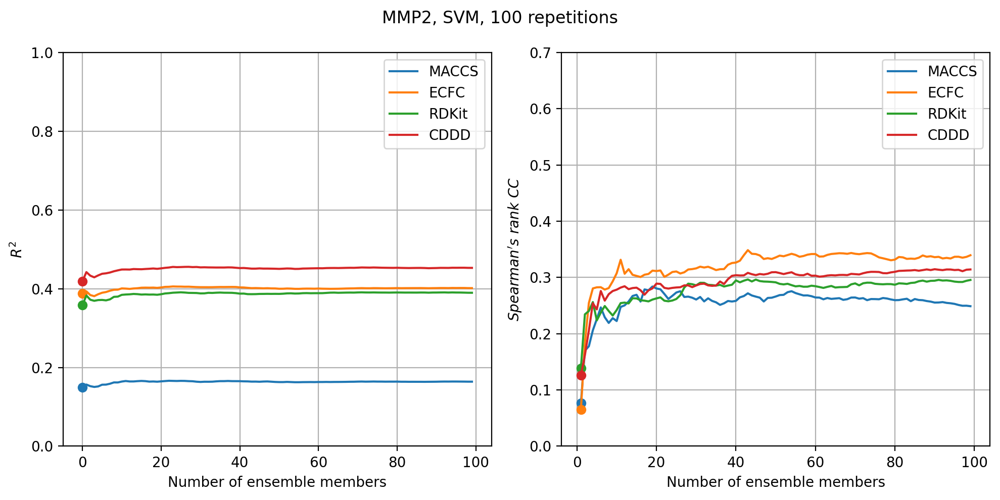

Took 3 Second(s). 


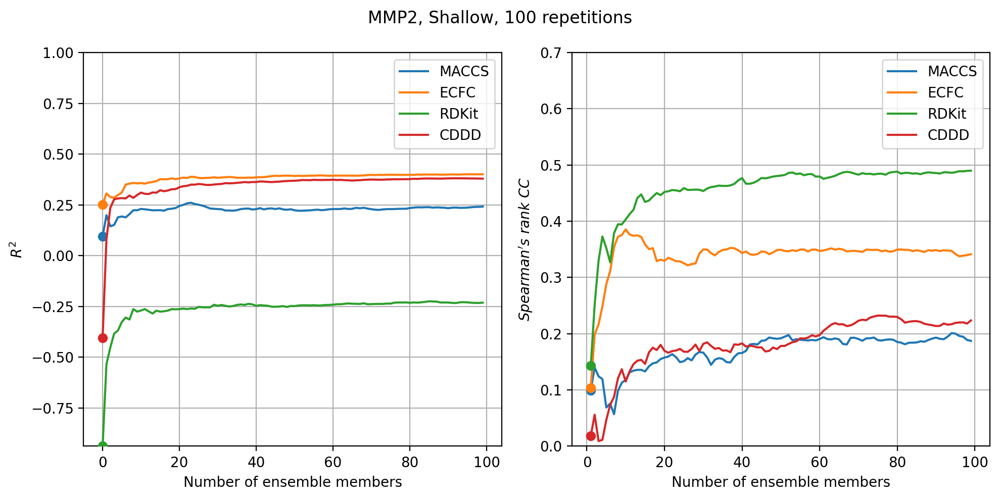

Took 3 Second(s). 


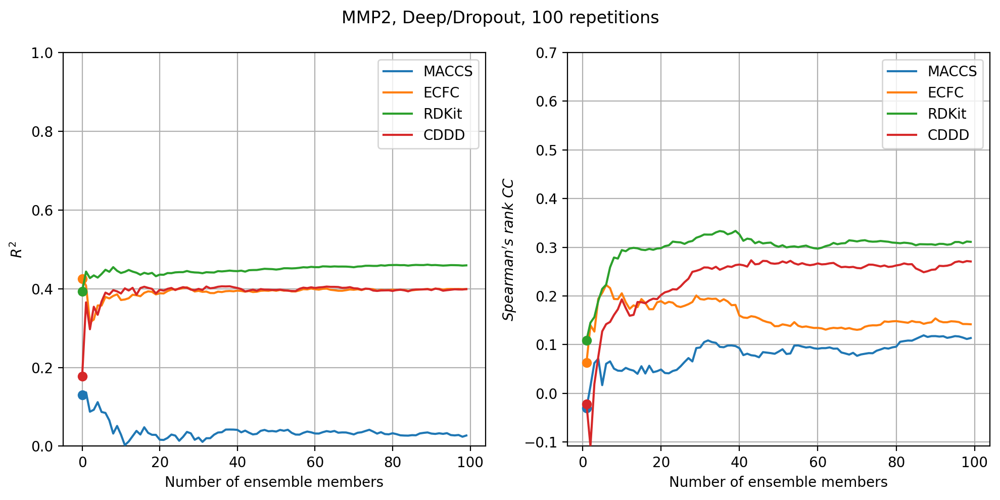

Took 3 Second(s). 


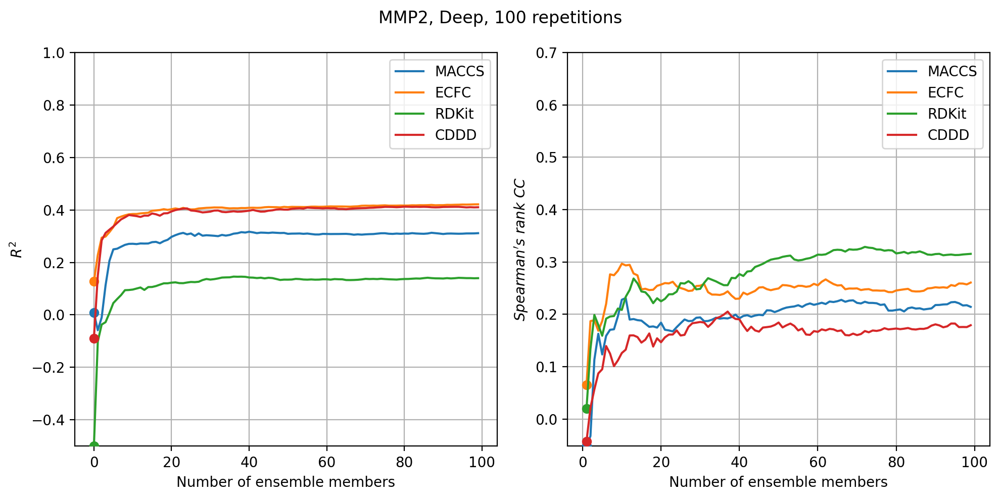

Took 3 Second(s). 


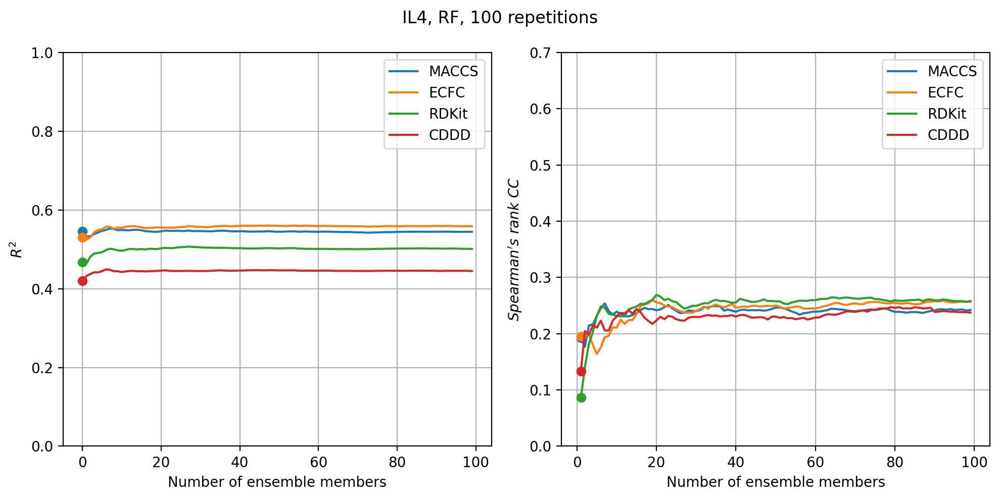

Took 3 Second(s). 


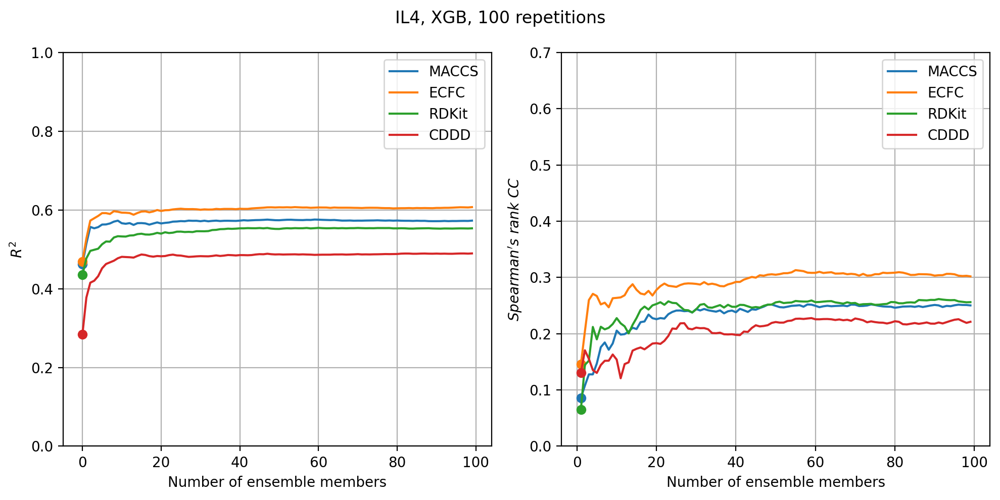

Took 3 Second(s). 


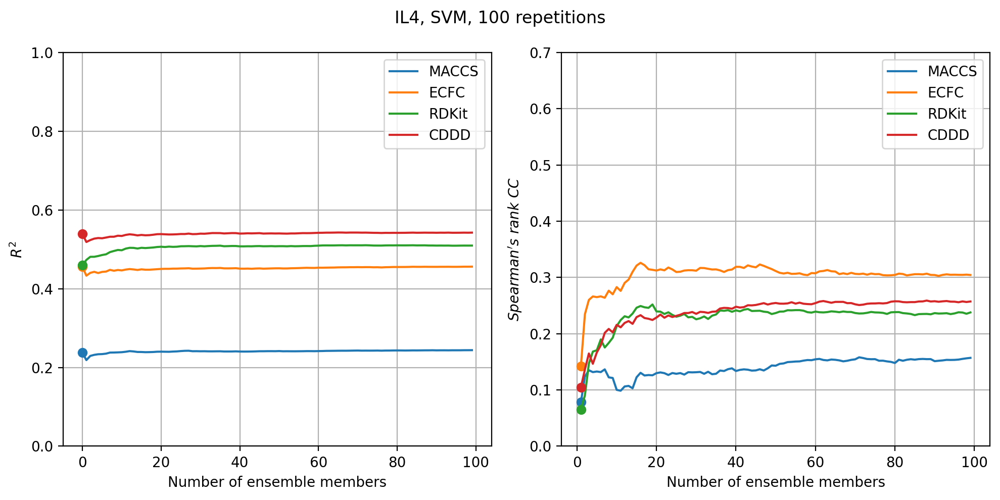

Took 3 Second(s). 


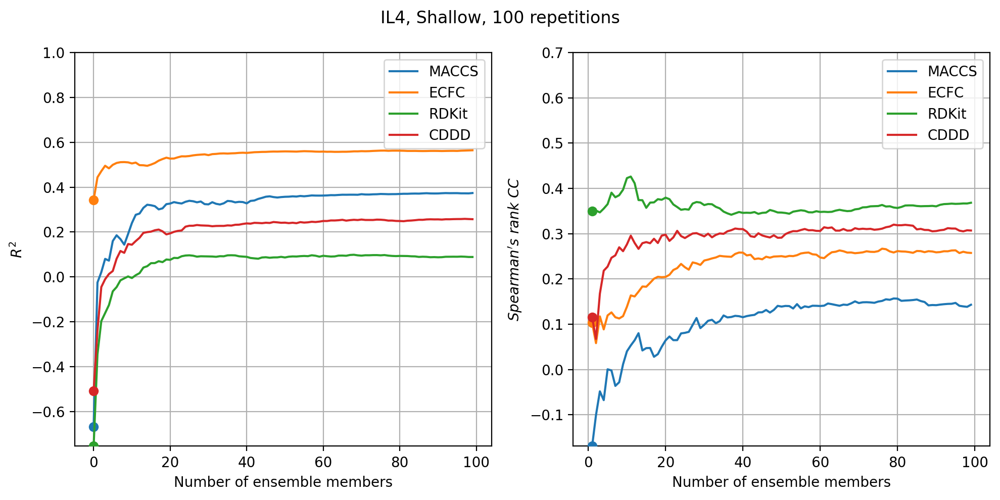

Took 3 Second(s). 


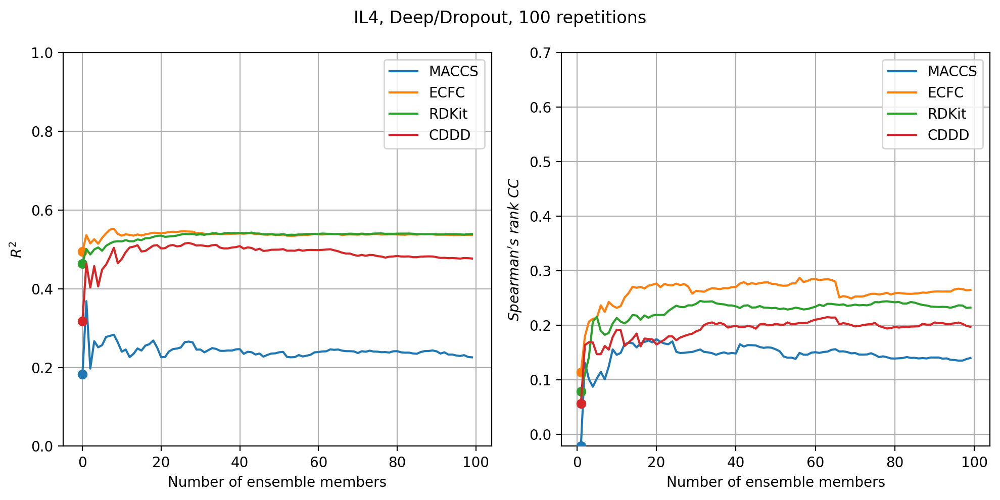

Took 3 Second(s). 


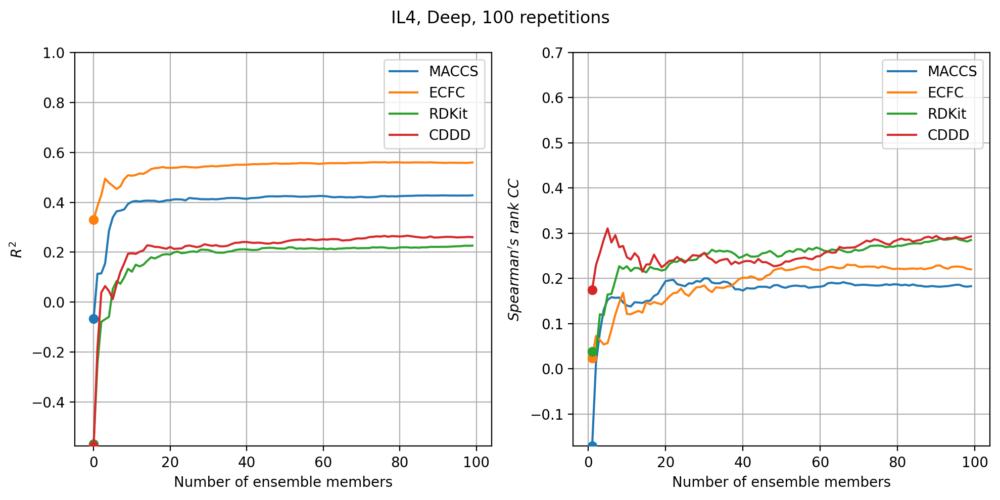

Took 3 Second(s). 


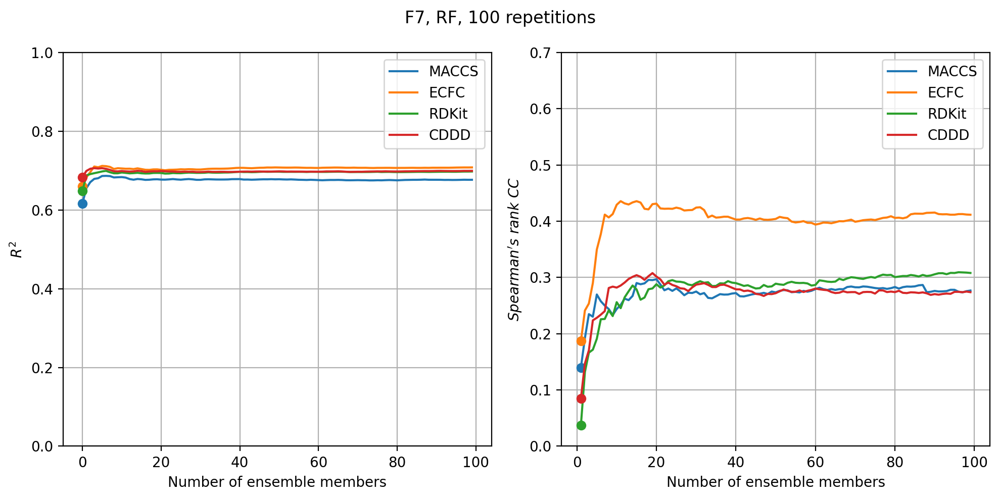

Took 3 Second(s). 


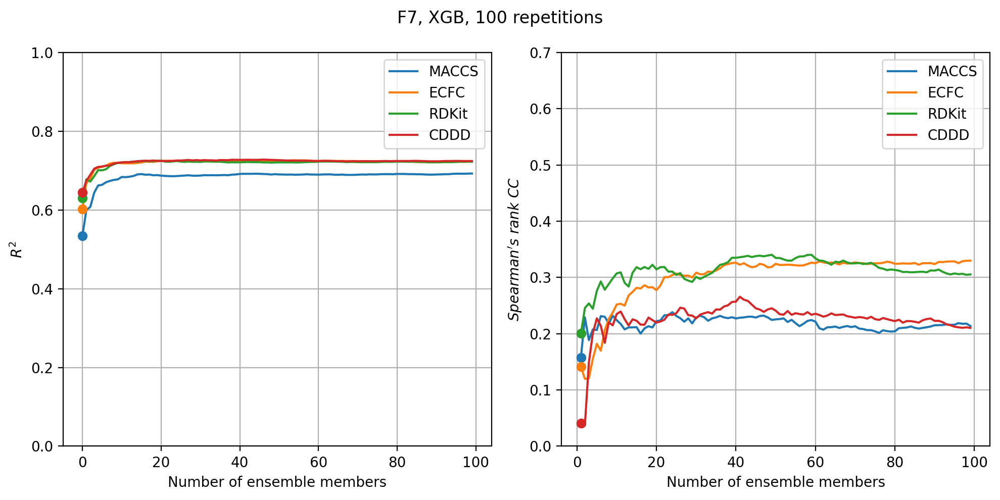

Took 3 Second(s). 


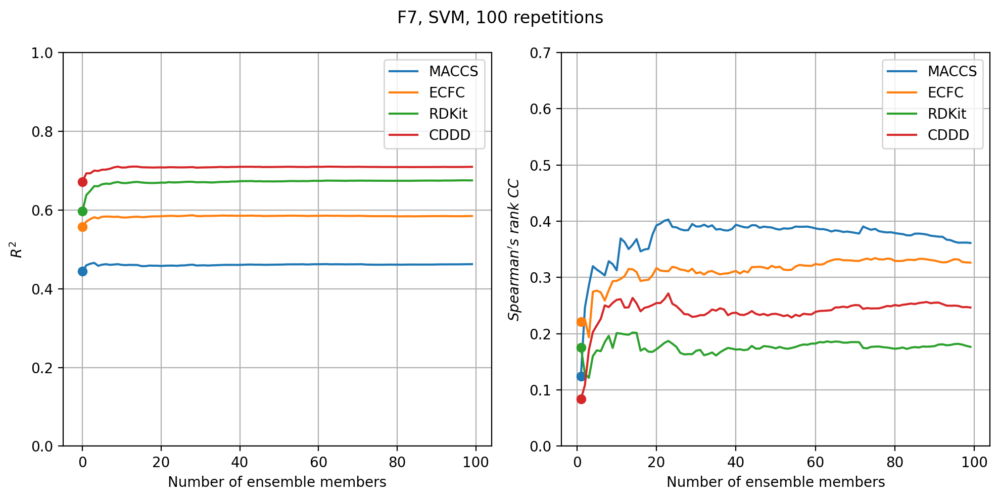

Took 3 Second(s). 


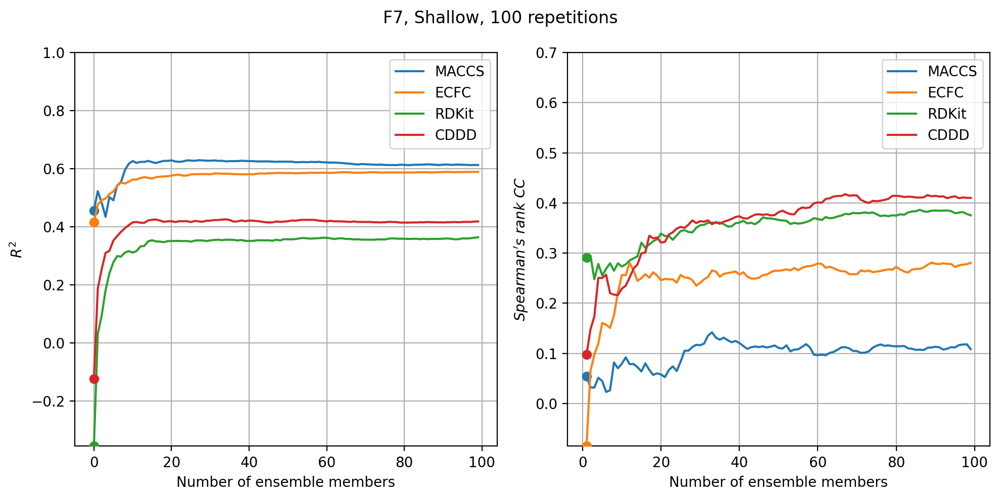

Took 3 Second(s). 


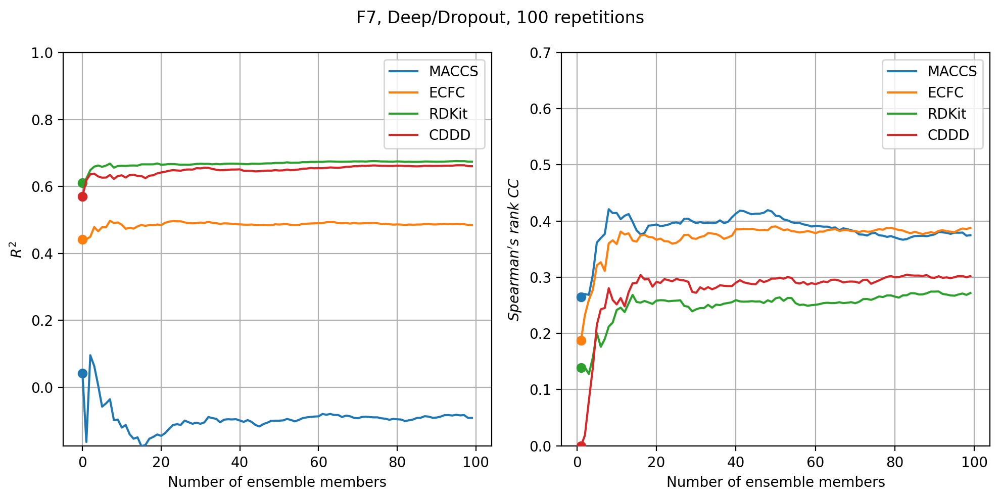

Took 3 Second(s). 


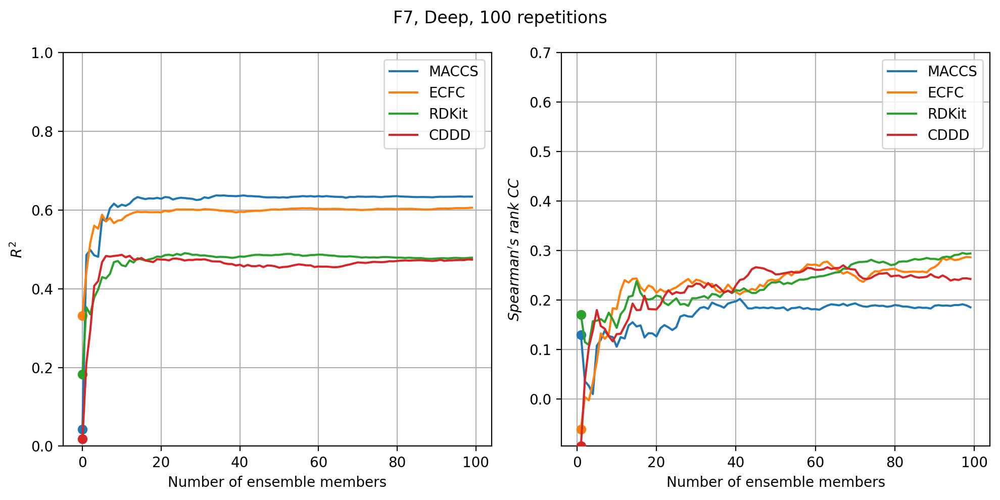

Took 3 Second(s). 


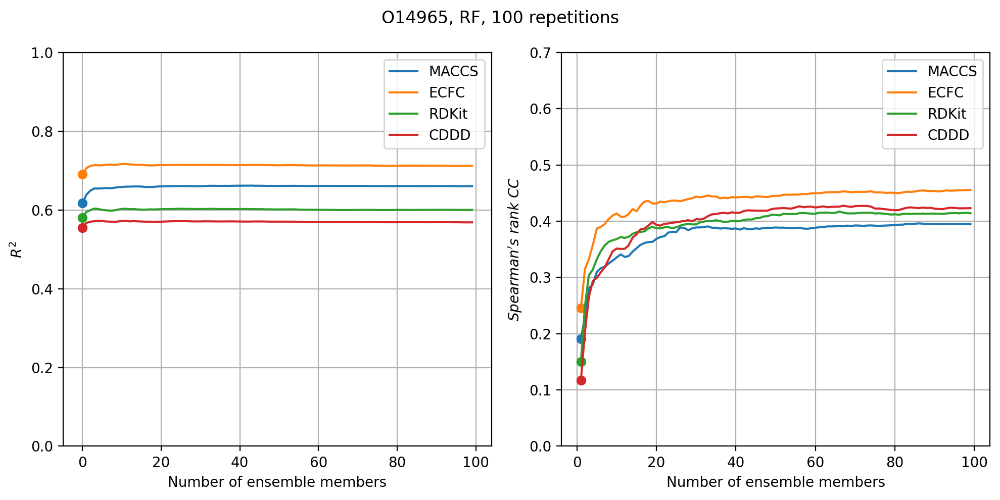

Took 4 Second(s). 


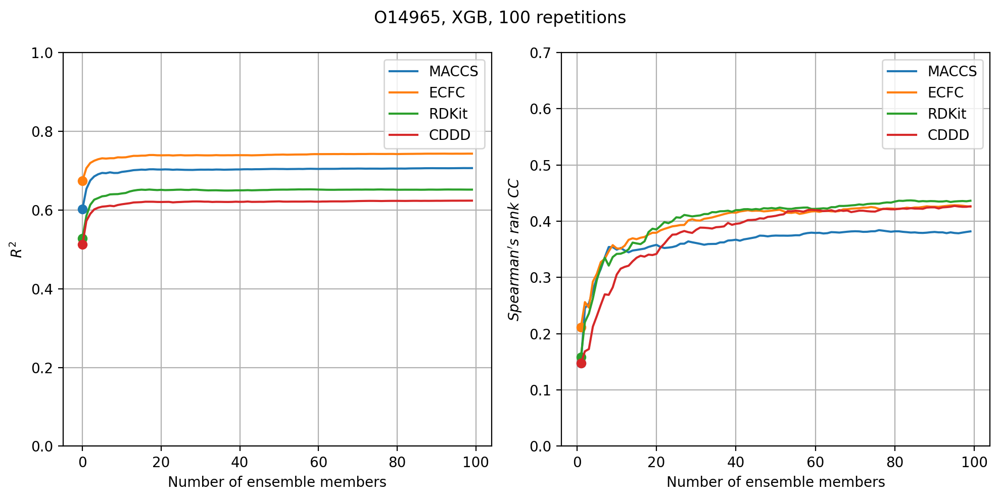

Took 4 Second(s). 


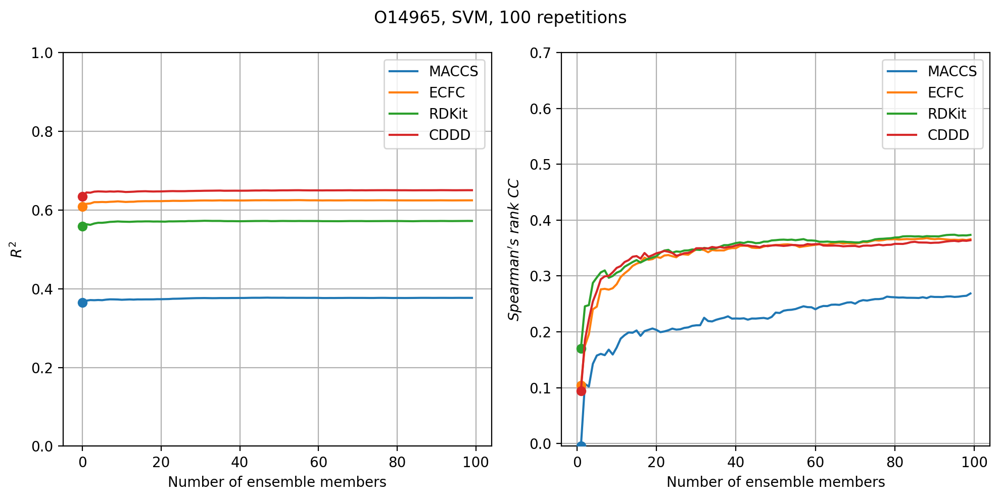

Took 4 Second(s). 


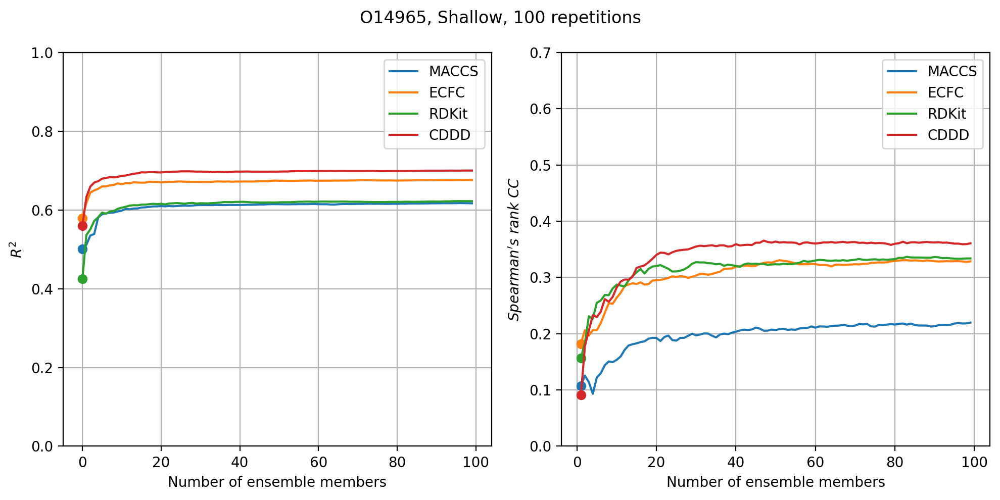

Took 4 Second(s). 


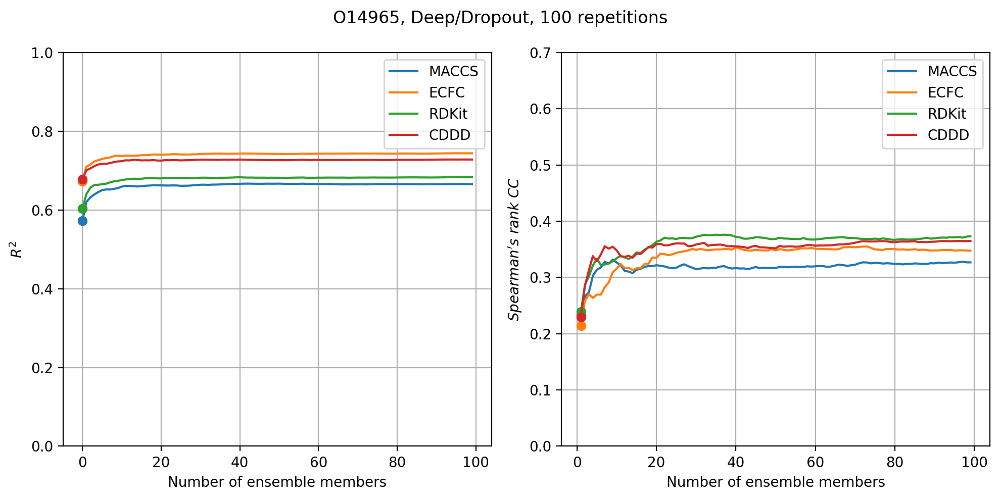

Took 4 Second(s). 


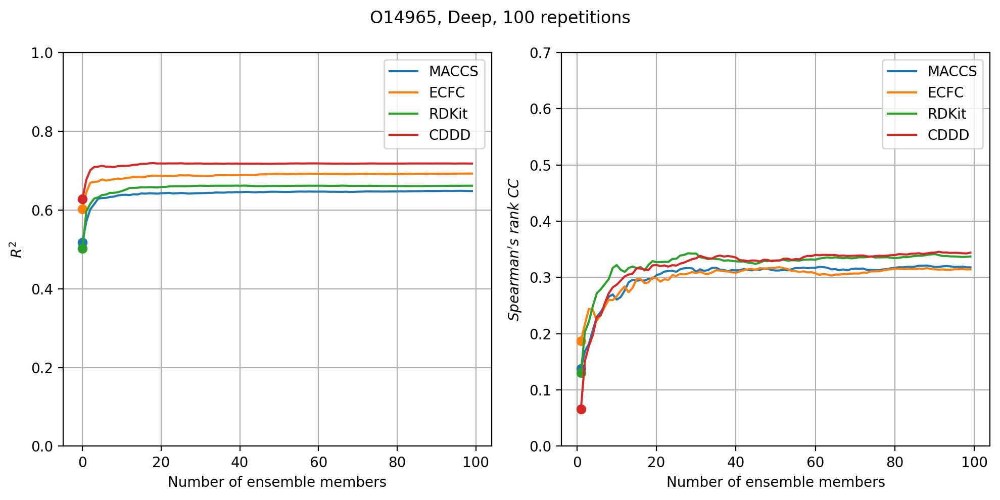

Took 4 Second(s). 


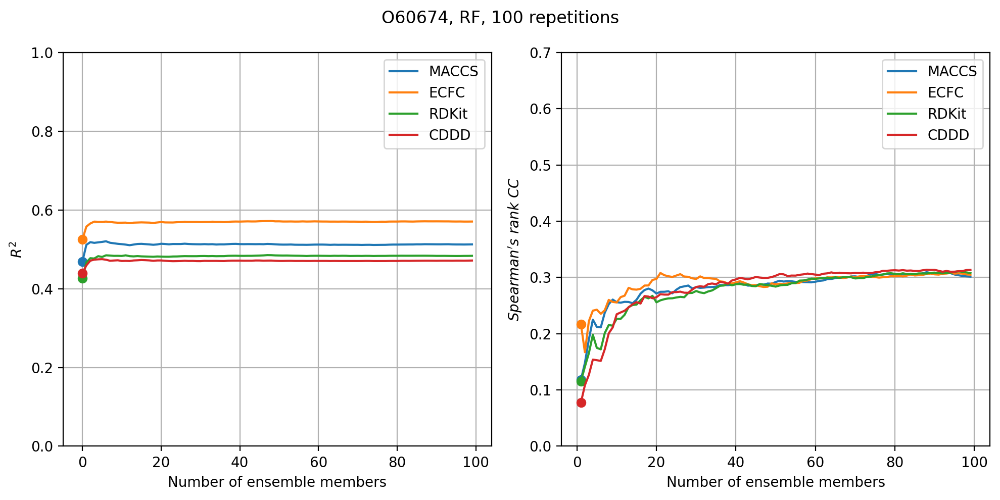

Took 3 Second(s). 


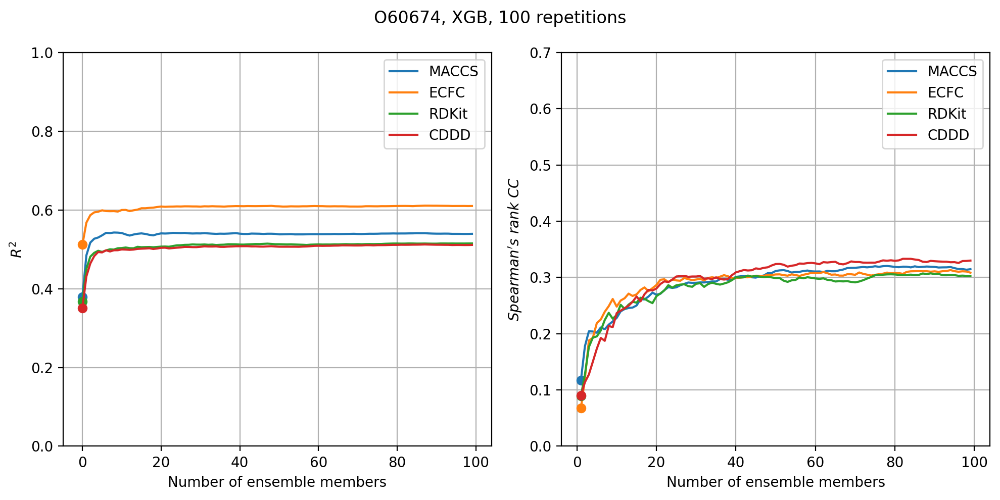

Took 3 Second(s). 


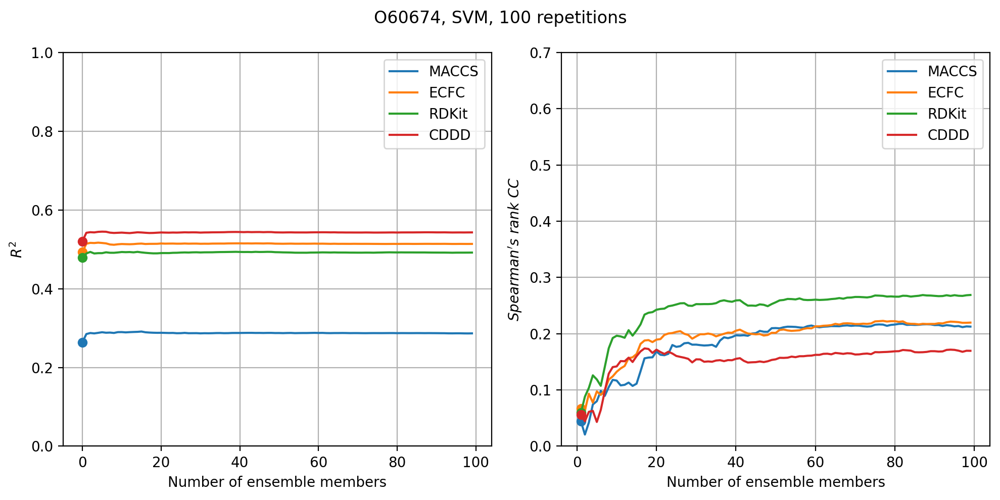

Took 3 Second(s). 


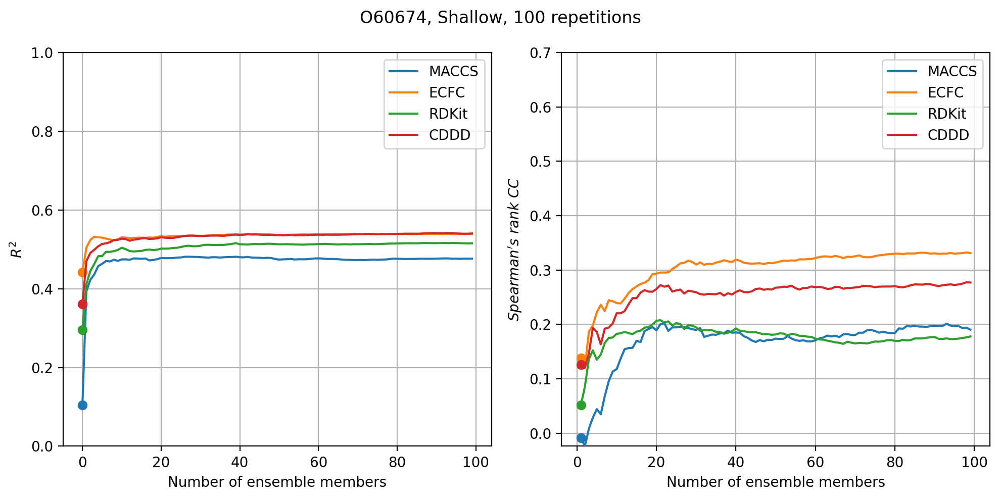

Took 3 Second(s). 


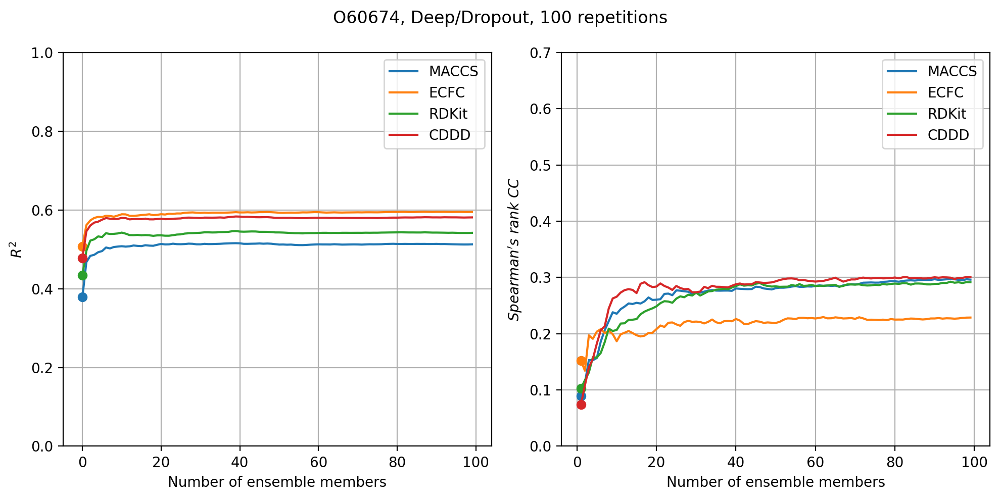

Took 3 Second(s). 


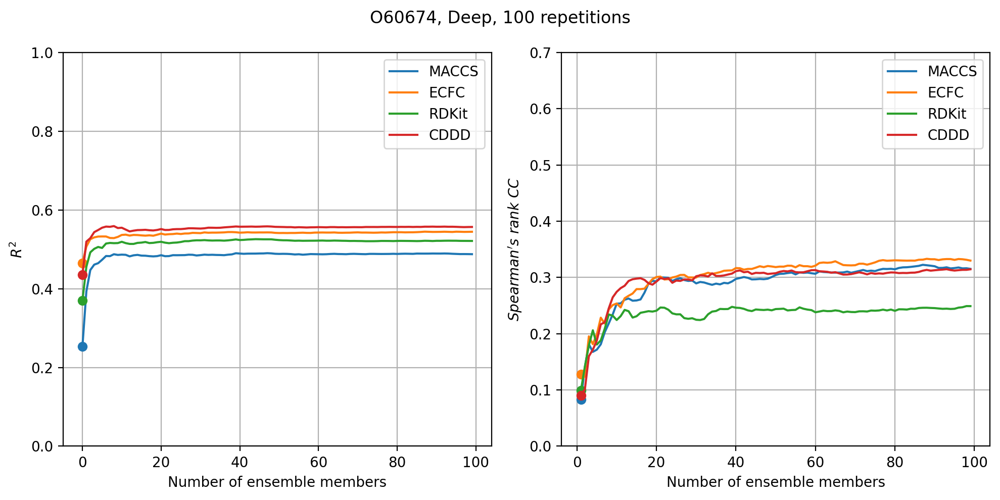

Took 3 Second(s). 


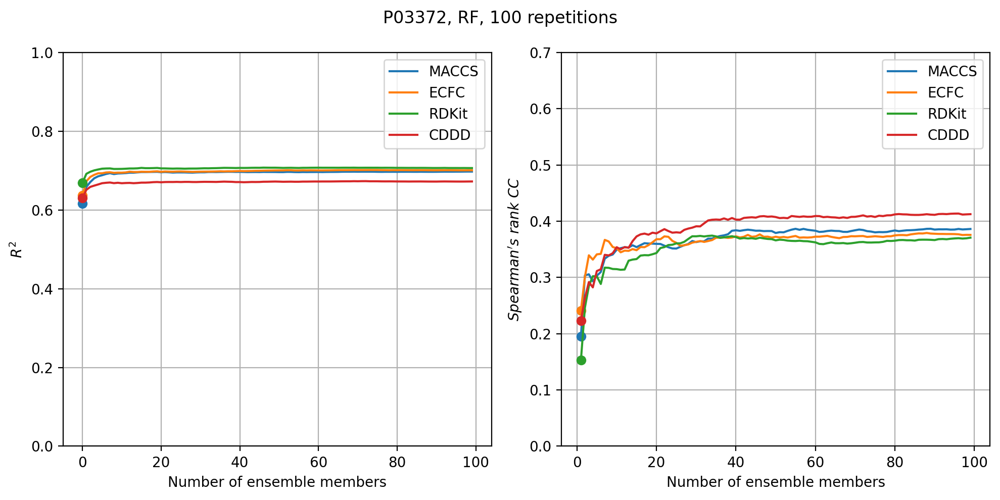

Took 3 Second(s). 


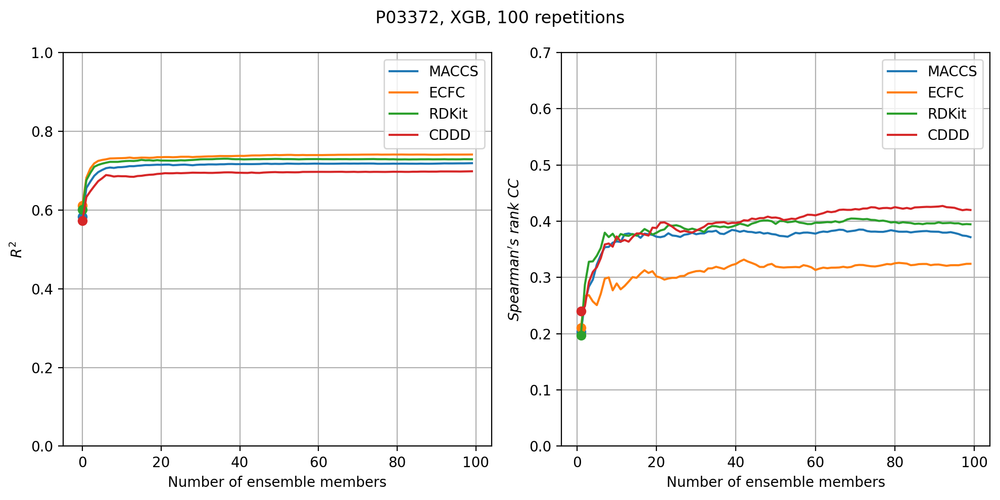

Took 3 Second(s). 


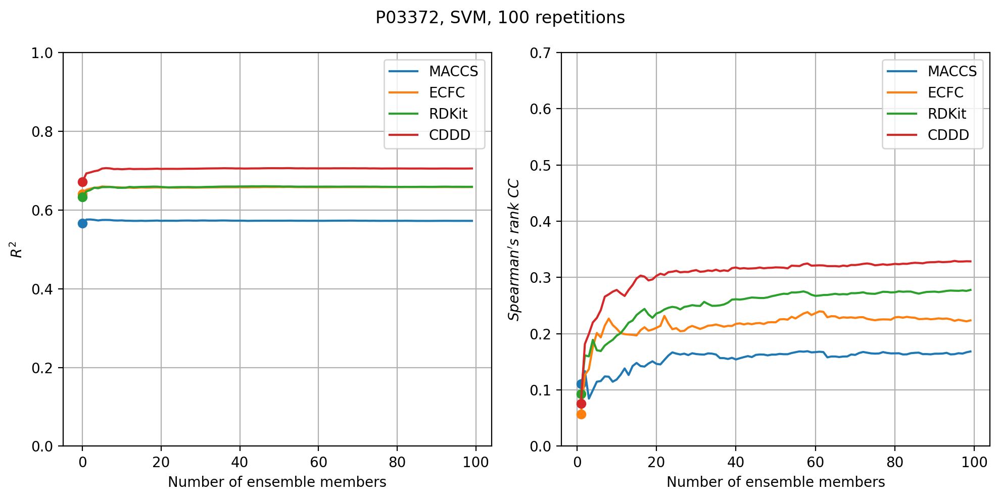

Took 3 Second(s). 


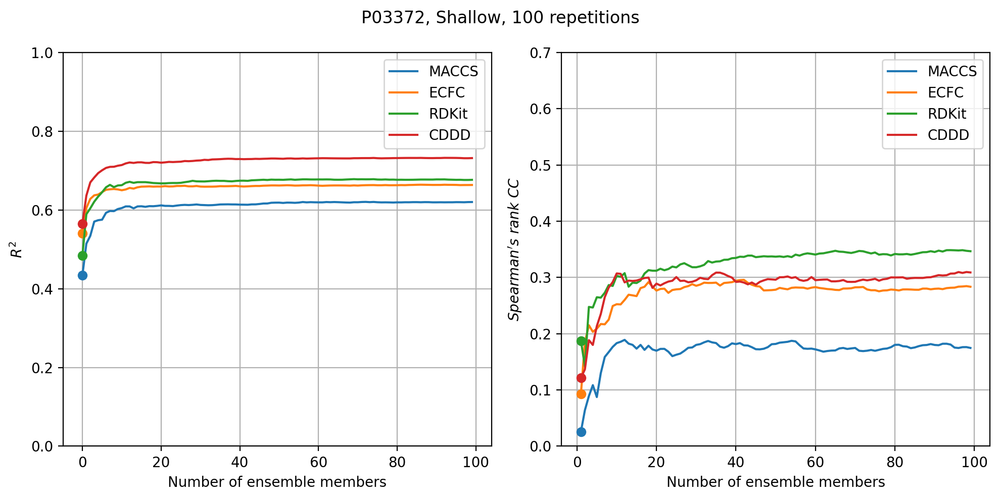

Took 3 Second(s). 


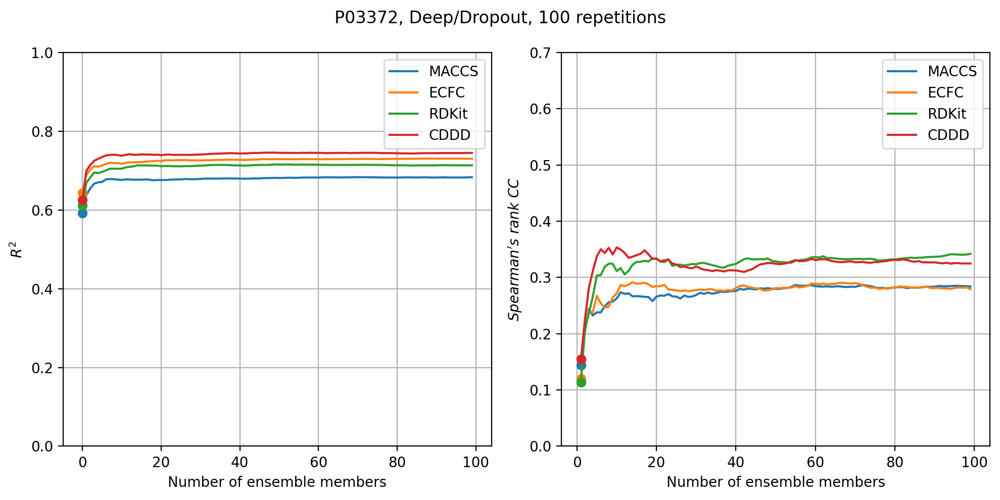

Took 3 Second(s). 


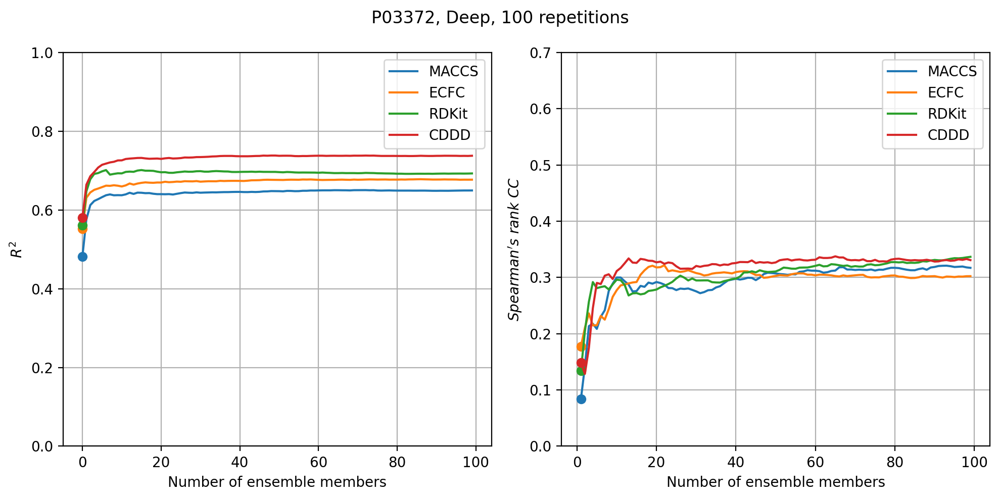

Took 3 Second(s). 


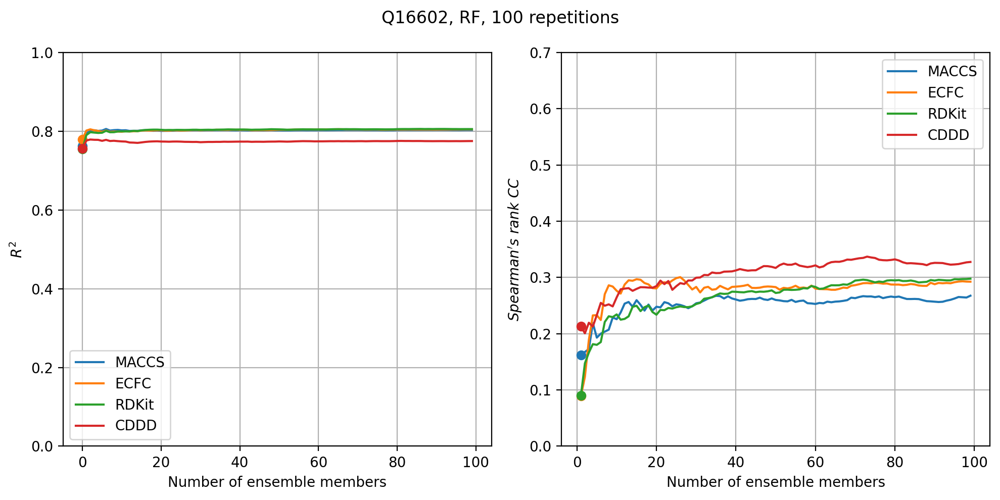

Took 3 Second(s). 


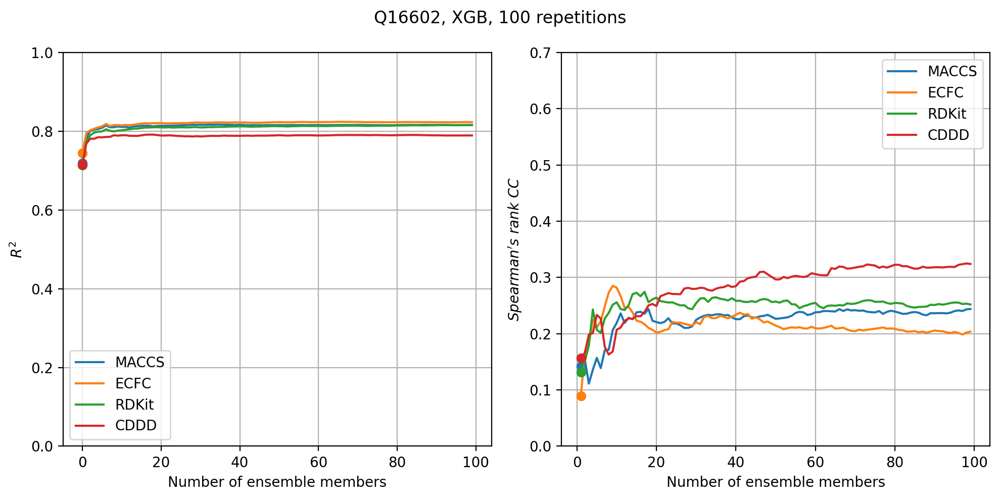

Took 3 Second(s). 


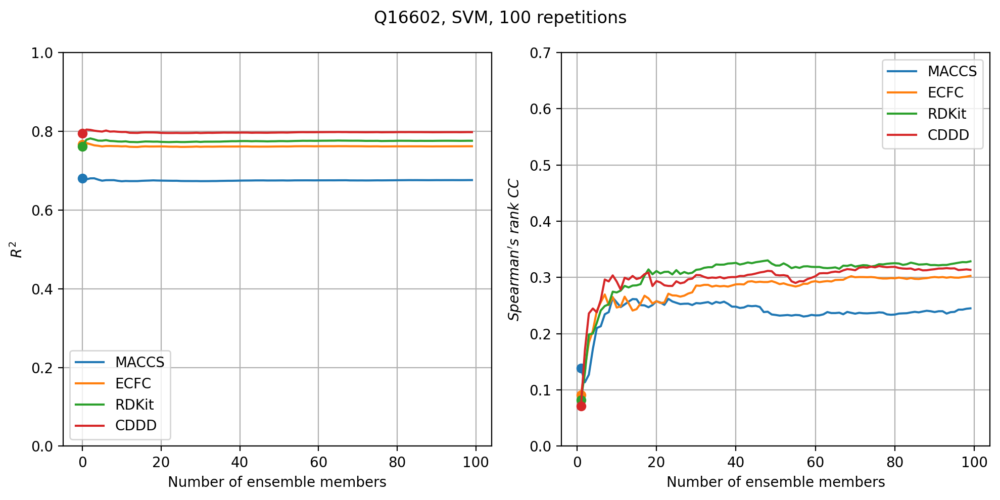

Took 3 Second(s). 


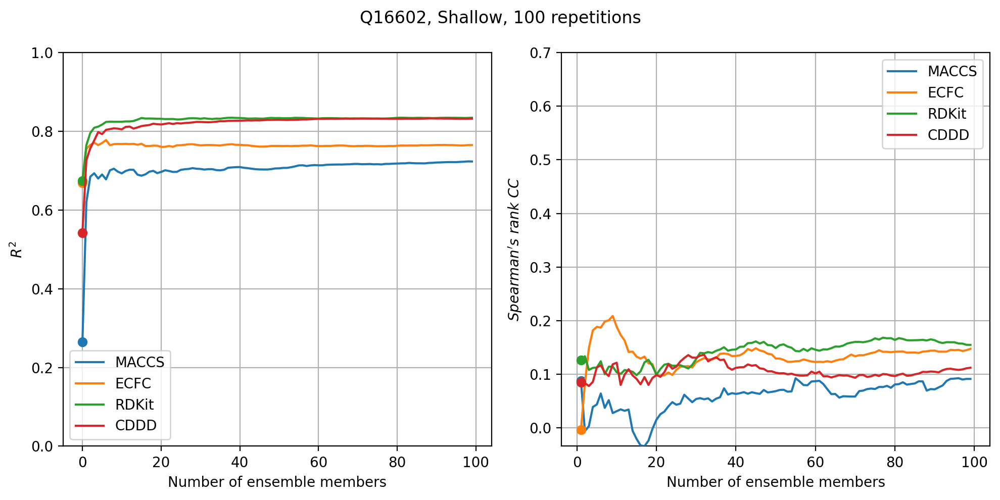

Took 3 Second(s). 


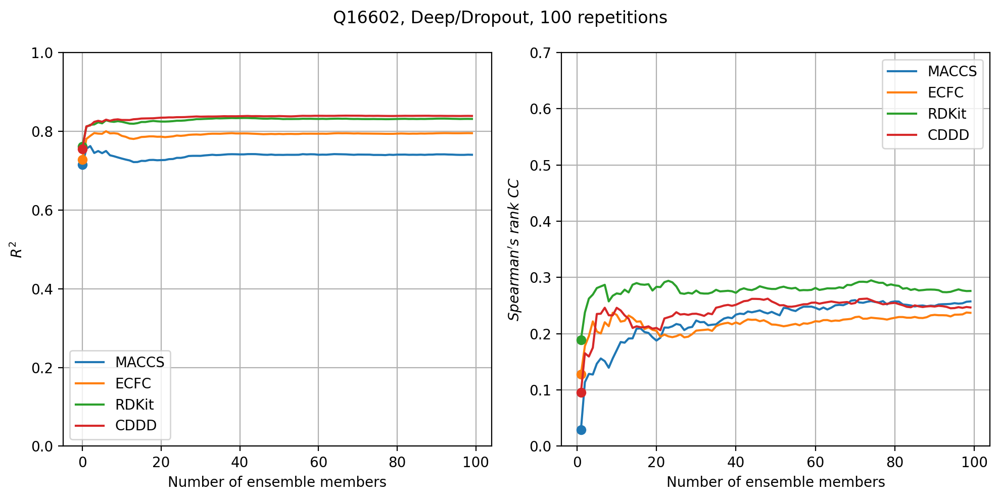

Took 3 Second(s). 


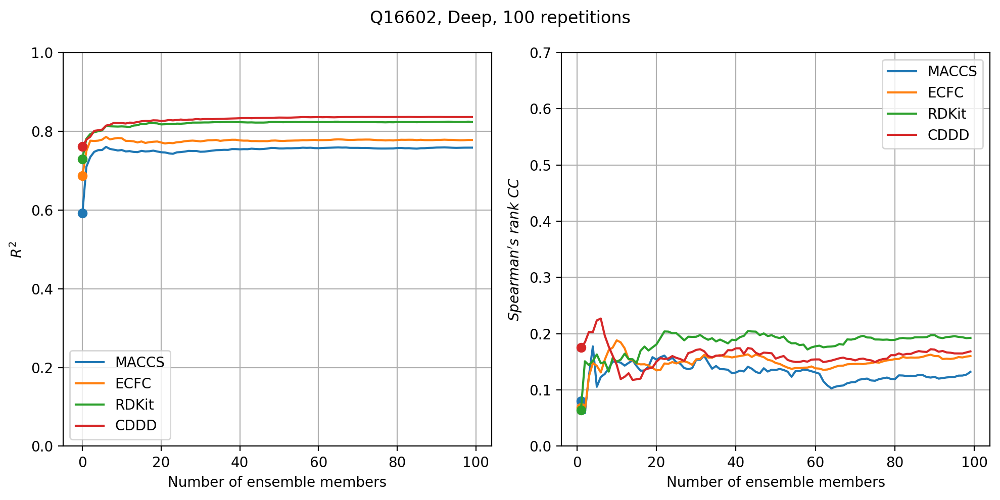

Took 3 Second(s). 


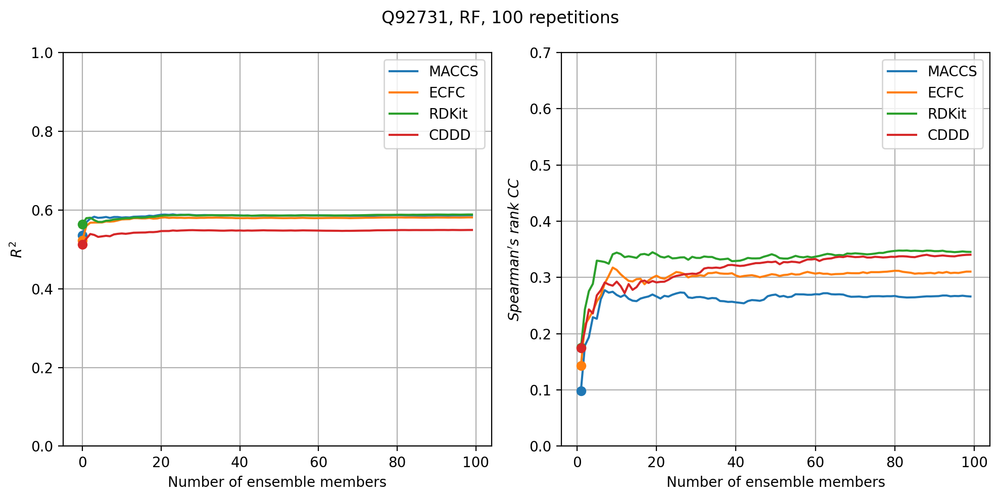

Took 3 Second(s). 


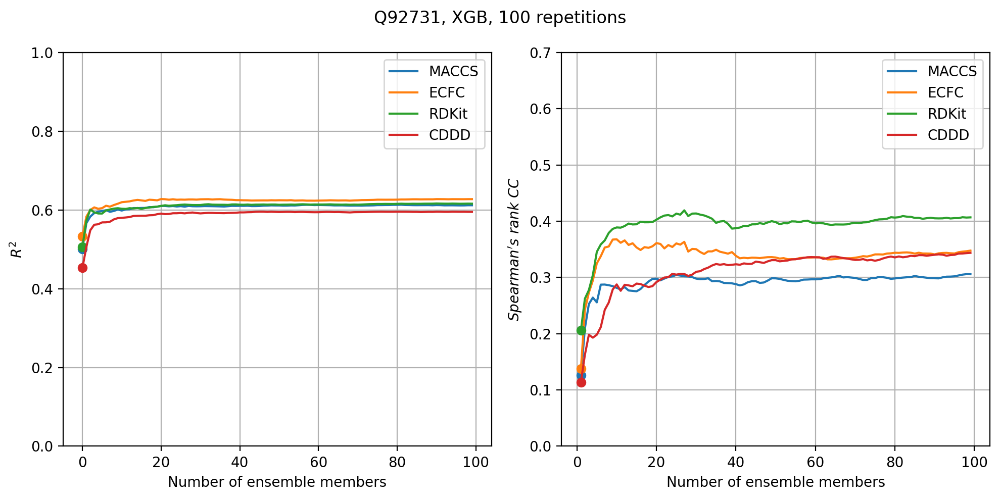

Took 3 Second(s). 


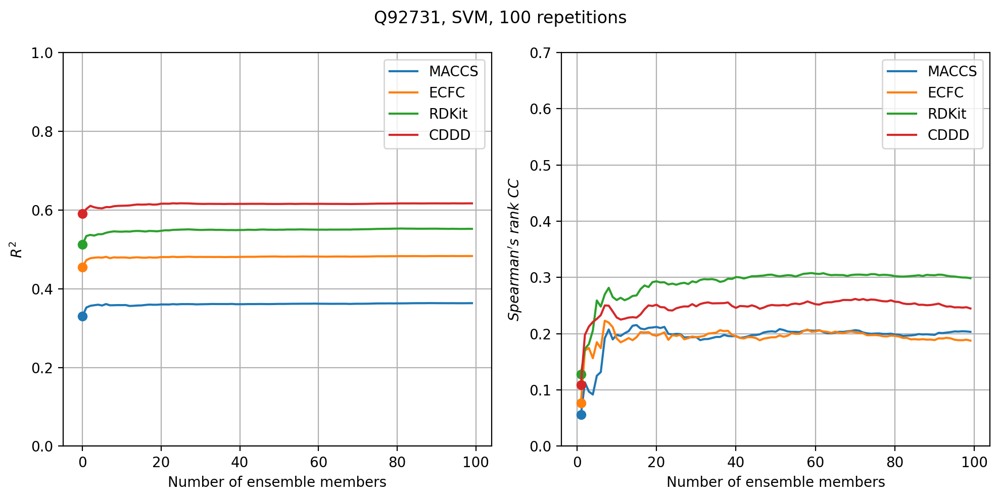

Took 3 Second(s). 


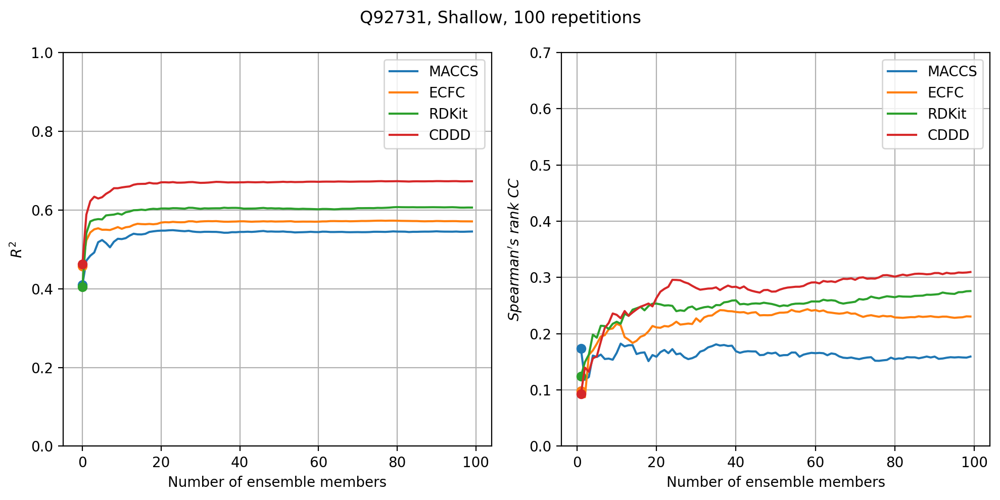

Took 3 Second(s). 


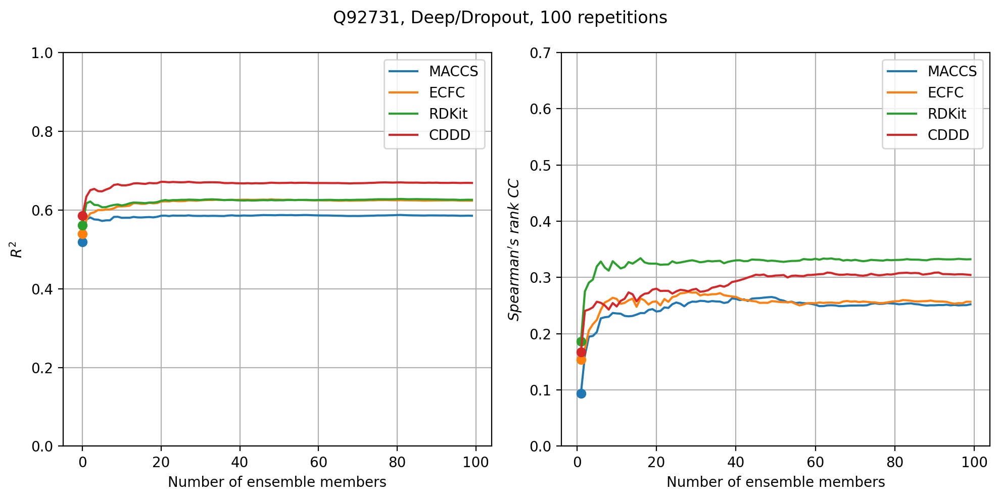

Took 3 Second(s). 


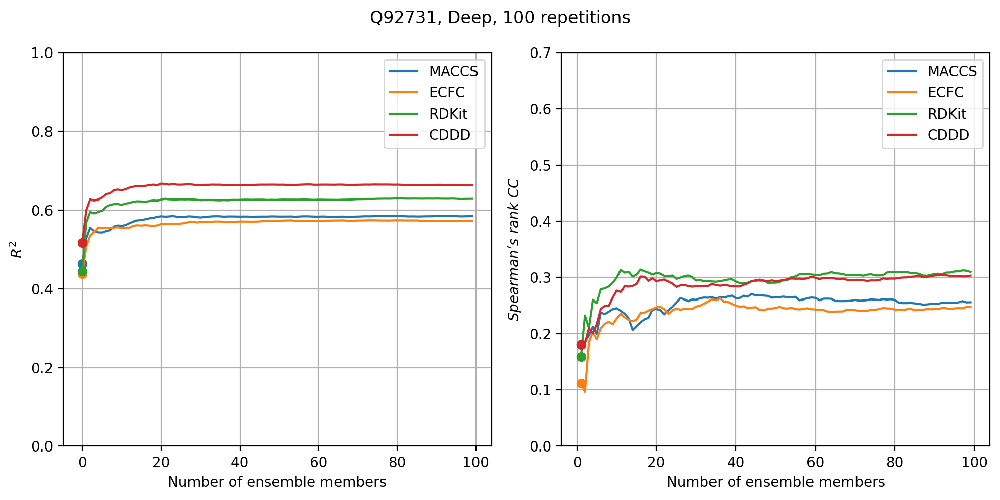

Took 3 Second(s). 


In [5]:
for name in dataset_names:
    for algorithm in algorithms:
        plot_for_descriptors(name, algorithm, descriptors, do_harmonize=False, plot_folder=f'{PLOT_FOLDER}/')

Plot harmonized

In [6]:
#for name in dataset_names:
#    for algorithm in algorithms:
#        plot_for_descriptors(name, algorithm, descriptors, do_harmonize=True, plot_folder=f'{PLOT_FOLDER}harmonized/')